# Packages

In [ ]:
import numpy as np
import pandas as pd
import math
import itertools

#matplotlib libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors
import seaborn as sns

#date libraries
from dateutil import parser
from datetime import datetime, timedelta, date
import holidays

#pandas options
#pd.set_option('display.float_format', lambda x: '%.2f' % x)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

#matplotlib setting defaults
sns.set(rc={
 "axes.axisbelow": False,
 "axes.edgecolor": "lightgrey",
 "axes.facecolor": "None",
 "axes.grid": False,
 "axes.labelcolor": "dimgrey",
 "figure.facecolor": "white",
 "lines.solid_capstyle": "round",
 "patch.edgecolor": "w",
 "patch.force_edgecolor": True,
 "text.color": "dimgrey",
 "xtick.bottom": False,
 "xtick.color": "dimgrey",
 "xtick.direction": "out",
 "xtick.top": False,
 "ytick.color": "dimgrey",
 "ytick.direction": "out",
 "ytick.left": False,
 "ytick.right": False})

#change variables names to snake_case
import re

#Impute
from sklearn.impute import SimpleImputer

#Skewness
import scipy
from scipy.stats import skew
#chi2 test
from scipy.stats import chi2_contingency

#Dowsampling dataset
from sklearn.utils import resample

In [ ]:
%matplotlib inline

from pathlib import Path

import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn import metrics
import statsmodels.api as sm
from sklearn.metrics import roc_curve, auc

!pip install mord
from mord import LogisticIT
import matplotlib.pylab as plt
import seaborn as sns

!pip install dmba
from dmba import classificationSummary, gainsChart, liftChart
from dmba import backward_elimination, forward_selection, stepwise_selection
from dmba import adjusted_r2_score, AIC_score, BIC_score
from dmba import plotDecisionTree
from dmba.metric import AIC_score

  Preparing metadata (setup.py) ... done
  Created wheel for mord: filename=mord-0.7-py3-none-any.whl size=9886 sha256=f7e8ca43c8c2f3aece64593fd030d5d2972f522b26057a78597b9e788b30a483
  Stored in directory: /root/.cache/pip/wheels/77/00/19/3cea86fbfc737ec4acb515cd94497dcc33f943fa157548b96c
Successfully built mord
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 54.0 MB/s eta 0:00:00
Colab environment detected.


In [ ]:
!pip install pycountry
import pycountry

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 43.9 MB/s eta 0:00:00


In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Read DataSet

In [ ]:
#Reading two datasets
#df1: dataset for Resort Hotels
#df2: dataste for City Hotels
H1 = pd.read_csv('H1.csv')
H2 = pd.read_csv('H2.csv')

In [ ]:
H1.head()

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,342,2015,July,27,1,0,0,2,0,...,No Deposit,NULL,NULL,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,0,737,2015,July,27,1,0,0,2,0,...,No Deposit,NULL,NULL,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,0,7,2015,July,27,1,0,1,1,0,...,No Deposit,NULL,NULL,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,0,13,2015,July,27,1,0,1,1,0,...,No Deposit,304,NULL,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,0,14,2015,July,27,1,0,2,2,0,...,No Deposit,240,NULL,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
H2.head()

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,0,6,2015,July,27,1,0,2,1,0.0,...,No Deposit,6,NULL,0,Transient,0.0,0,0,Check-Out,2015-07-03
1,1,88,2015,July,27,1,0,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,1,Canceled,2015-07-01
2,1,65,2015,July,27,1,0,4,1,0.0,...,No Deposit,9,NULL,0,Transient,68.0,0,1,Canceled,2015-04-30
3,1,92,2015,July,27,1,2,4,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,2,Canceled,2015-06-23
4,1,100,2015,July,27,2,0,2,2,0.0,...,No Deposit,9,NULL,0,Transient,76.5,0,1,Canceled,2015-04-02


In [ ]:
H1.shape

(40060, 31)

In [ ]:
H2.shape

(79330, 31)

Both datasets contains the same number of variables with the same structure (**31 variables**).Resort Hotels datset contains **40,060 records**. City Hotel dataset contains **79,330 record**.

# Initial Data Cleansing and Preparation

In [ ]:
#Add a new column to each dataset to identify if the record is from Resort Hotel (1) or City Hotel (0)
H1['hotel_type'] = 1
H2['hotel_type'] = 0

In [ ]:
#Concatenate both datasets, axis=0 stacks vertically
df = pd.concat([H1, H2], axis=0)
df.head()

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate,hotel_type
0,0,342,2015,July,27,1,0,0,2,0.0,...,NULL,NULL,0,Transient,0.0,0,0,Check-Out,2015-07-01,1
1,0,737,2015,July,27,1,0,0,2,0.0,...,NULL,NULL,0,Transient,0.0,0,0,Check-Out,2015-07-01,1
2,0,7,2015,July,27,1,0,1,1,0.0,...,NULL,NULL,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
3,0,13,2015,July,27,1,0,1,1,0.0,...,304,NULL,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
4,0,14,2015,July,27,1,0,2,2,0.0,...,240,NULL,0,Transient,98.0,0,1,Check-Out,2015-07-03,1


In [ ]:
df.shape

(119390, 32)

The two datasets, H1 and H2, were merged and the column **resort_hotel** was created for each dataset to be able to identify if the record corresponds to a resort hotel (1) or a city hotel (0) The dataset df is the result of the merging process, containing **119,390 entries** and **32 variables**

In [ ]:
#Changing CamelCase name variables (e.g., ArrivalDateMonth) to snake_case (e.g., arrival_date_month)
def camel_to_snake(name):
    s1 = re.sub('(.)([A-Z][a-z]+)', r'\1_\2', name)
    s2 = re.sub('([a-z0-9])([A-Z])', r'\1_\2', s1)
    return s2.lower()

df = df.rename(columns=lambda x: camel_to_snake(x))
print(df.columns)

Index(['is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month',
       'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'hotel_type'],
      dtype='object')


The initial variable names had a CamelCase structure and were changed to **snake_case** structure by separating words with underscores, enhancing readability and consistency.

In [ ]:
#Rename the column adr
df = df.rename(columns={'adr':'average_daily_rate'})

In [ ]:
#Checking the variables types
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 119390 entries, 0 to 79329
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   is_canceled                     119390 non-null  int64  
 1   lead_time                       119390 non-null  int64  
 2   arrival_date_year               119390 non-null  int64  
 3   arrival_date_month              119390 non-null  object 
 4   arrival_date_week_number        119390 non-null  int64  
 5   arrival_date_day_of_month       119390 non-null  int64  
 6   stays_in_weekend_nights         119390 non-null  int64  
 7   stays_in_week_nights            119390 non-null  int64  
 8   adults                          119390 non-null  int64  
 9   children                        119386 non-null  float64
 10  babies                          119390 non-null  int64  
 11  meal                            119390 non-null  object 
 12  country               

In [ ]:
#Changing the variables types
df['is_canceled'] = df['is_canceled'].astype('category')
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])
df['children'] = df['children'].fillna(0).astype('int')
df['is_repeated_guest'] = df['is_repeated_guest'].astype('category')
df['hotel_type'] = df['hotel_type'].astype('category')

In [ ]:
#Create the column "arrival_date" with the three columns arrival_date: year, month, day_of_month
#and drop those three columns
df['arrival_date'] = pd.to_datetime(df['arrival_date_year'].astype(str) + '-' +
                                      df['arrival_date_month'] + '-' +
                                      df['arrival_date_day_of_month'].astype(str))

*   The column **arrival_date** was created as the result of joining the columns: arrival_date_year, arrival_date_month, and arrival_date_day_of_month.



In [ ]:
#Saving the variables types
original_dtypes = df.dtypes

In [ ]:
#Checking for duplicates entries
df.duplicated().sum()

31994

In [ ]:
#Drop duplicates entries and leave just the first entry
#df.drop_duplicates(keep='first', inplace=True)
df.shape

(119390, 33)

*   Duplicates entries were checked and it was found **31,994 duplicated entries**, that occur because multiple bookings with identical atrributes may occur on the same and we are not able to classify if thet are true duplicates without a unique identifier like 'booking_id'.
*   The model was tested with and without the duplicates, and it was found the model performs better with the duplicates; therefore, I decided to keep the duplicates records.

# EDA

## *Descriptive Statistics*

In [ ]:
df.describe()

,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,average_daily_rate,required_car_parking_spaces,total_of_special_requests,reservation_status_date,arrival_date
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390,119390
mean,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103886,0.007949,0.087118,0.137097,0.221124,2.321149,101.831122,0.062518,0.571363,2016-07-30 00:24:47.883407104,2016-08-28 16:39:45.727447808
min,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.380000,0.000000,0.000000,2014-10-17 00:00:00,2015-07-01 00:00:00
25%,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,69.290000,0.000000,0.000000,2016-02-01 00:00:00,2016-03-13 00:00:00
50%,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,94.575000,0.000000,0.000000,2016-08-07 00:00:00,2016-09-06 00:00:00
75%,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,126.000000,0.000000,1.000000,2017-02-08 00:00:00,2017-03-18 00:00:00
max,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,26.000000,72.000000,21.000000,391.000000,5400.000000,8.000000,5.000000,2017-09-14 00:00:00,2017-08-31 00:00:00
std,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398555,0.097436,0.844336,1.497437,0.652306,17.594721,50.535790,0.245291,0.792798,NaN,NaN


**lead_time:** the average lead time is 104.01 days with a standard deviation of 106.86 days.

**stays_in_weekend_nights** and **stays_in_week_nights**: bookings have a mean of 0.93 nights for weekends and 2.5 nights for weekdays, with a maximum of 19 nights for weekends and 50 nights for weekdays.

**adults, children, babies:** the average booking includes approximately 1.86 adults, 0.10 children, and 0.01 babies.

**previous_cancellations** and **previous_bookings_not_canceled:** mean of 0.09 for previous cancellation and 0.14 for previous bookings not cancelled.

**booking_changes:**the mean of 0.22 and a maximum value of 21 changes.

**days_in_waiting_list:** mean of 2.32 days and a maximum of 391 days.

**average_daily_rate:** the mean average daily rate is 101.83 with a standard deviation of 50.54.There are two extreme values of -6.38 and 5,400.

**required_car_parking _spaces** and **total_of_special_requests:** these variables present low means, 0.06 and 0.57 respectively, and maximum values of 8 and 5 respectively.

In [ ]:
df.describe(include = ['object', 'category'])

,is_canceled,arrival_date_month,meal,country,market_segment,distribution_channel,is_repeated_guest,reserved_room_type,assigned_room_type,deposit_type,agent,company,customer_type,reservation_status,hotel_type
count,119390,119390,119390,118902,119390,119390,119390,119390,119390,119390,119390,119390,119390,119390,119390
unique,2,12,5,177,8,5,2,10,12,3,334,353,4,3,2
top,0,August,BB,PRT,Online TA,TA/TO,0,A,A,No Deposit,9,NULL,Transient,Check-Out,0
freq,75166,13877,92310,48590,56477,97870,115580,85994,74053,104641,31961,112593,89613,75166,79330


**hotel_type:** City Hotel represents 66.44% of the bookings and Resort Hotel the 33.55%.

**is_repeated_guest:** most of the bookings were not made from a repeated guest (97%).

**reserved_room_type** and **assigned_room_type:** the most common reserved room type is ‘A’ (72.02%) and the same applies to the assigned room type (62%).

**deposit_type:** most bookings are ‘No Deposit’ with a 87.64% of reservations.

**agent** and **company:** there are 334 unique agent IDs where the ID ‘9’ accounting for 26.78% of bookings; there are 353 unique company IDs where 94.3% of bookings have ‘NULL’.

In [ ]:
#Checking how many rows have 0 number of guests
df[(df['adults']==0) & (df['children']==0) & (df['babies']==0)].shape

(180, 33)

In [ ]:
#Checking how many rows have 0 adults and at least 1 children or baby
df[(df['adults']==0) & ((df['children']!=0) | (df['babies']!=0))].shape

(223, 33)

*   There are **180 bookings** that had **zero** for the variable **adults,
children and babies**, meaning that there were not any guests associated to an actual booking.
*   The records where the number of **adults is 0** and there is at **least one child or baby** are **223**.

In [ ]:
#Checking the distribution of repeated guests
df['is_repeated_guest'].value_counts(normalize=True)

,proportion
is_repeated_guest,
0,0.968088
1,0.031912


In [ ]:
#Checking the weight of each meal type
df['meal'].value_counts(normalize=True)

,proportion
meal,
BB,0.773180
HB,0.121141
SC,0.089203
Undefined,0.009791
FB,0.006684


**meal:** BB (Bed & Breakfast) meal type is predominant, accounting for 77% of bookings.

In [ ]:
#Checking the weight of each country
df['country'].value_counts(normalize=True).head()

,proportion
country,
PRT,0.408656
GBR,0.102008
FRA,0.087593
ESP,0.072059
DEU,0.061286


**country:** most of the guests come from Portugal (41%), followed by the United Kingdom (10%), and France (9%). There are 177 unique values for a country.

In [ ]:
#Checking the weight of market segment
df['market_segment'].value_counts(normalize=True)

,proportion
market_segment,
Online TA,0.473046
Offline TA/TO,0.202856
Groups,0.165935
Direct,0.105587
Corporate,0.044350
Complementary,0.006223
Aviation,0.001985
Undefined,0.000017


In [ ]:
#Checking how many records are Undefined for the market segment
df[(df['market_segment']=='Undefined')].shape

(2, 33)

**market_segment:** bookings with Online TA (Travel Agents) segment is the largest, comprising 47% of bookings. There are just 2 records that have ‘Undefined’ as market segment.

In [ ]:
#Checking the weight of distribution channel
df['distribution_channel'].value_counts(normalize=True)

,proportion
distribution_channel,
TA/TO,0.819750
Direct,0.122665
Corporate,0.055926
GDS,0.001617
Undefined,0.000042


In [ ]:
#Checking how many records are Undefined for the distribution channel
df[(df['distribution_channel']=='Undefined')].shape

(5, 33)

**distribution_channel:** bookings with TA/TO (Travel Agents/Travel Operators) channel is the largest channel, with 82%. The channel ‘Undefined’ has 5 records.

In [ ]:
#Checking the distribution of customer type
df['customer_type'].value_counts(normalize=True)

,proportion
customer_type,
Transient,0.750591
Transient-Party,0.210436
Contract,0.034140
Group,0.004833


**customer_type:** most customers are ‘Transient’ (75%) followed by ‘Transient-Party’ (21%).

In [ ]:
#Checking the distribution of reservation status
df['reservation_status'].value_counts(normalize=True)

,proportion
reservation_status,
Check-Out,0.629584
Canceled,0.360307
No-Show,0.010110


**reservation_status:** most of the reservations are ‘Check-Out’ (63%); however, a significant portion of bookings is ‘Canceled’ (36%).

In [ ]:
#Check the deposit type
df['deposit_type'].value_counts(normalize=True)

,proportion
deposit_type,
No Deposit,0.876464
Non Refund,0.122179
Refundable,0.001357


## *Visualization*

In [ ]:
#Distribution of the target variable (is_canceled) to check for unbalanced dataset
bookings_status_pct = df['is_canceled'].value_counts(normalize=True)
bookings_status_pct

,proportion
is_canceled,
0,0.629584
1,0.370416


Text(0, 0.5, 'Percentage of Bookings')

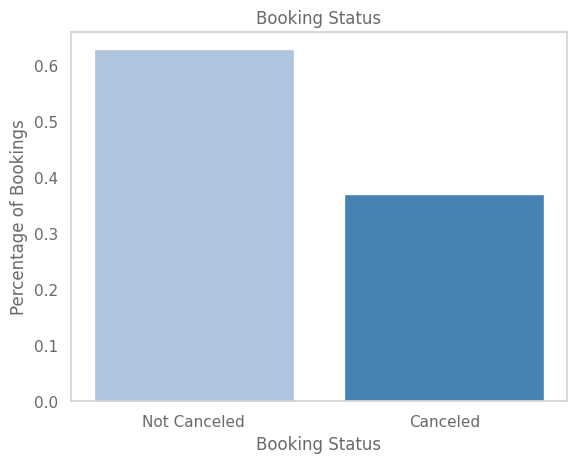

In [ ]:
#Bar chart to visualize the pct of canceled vs. no canceled bookings
fig, ax = plt.subplots()

ax.bar(bookings_status_pct.index, bookings_status_pct, color=['lightsteelblue', 'steelblue'])
ax.set_title('Booking Status')
ax.set_xticks(ticks=[0,1], labels=['Not Canceled', 'Canceled'])
ax.set_xlabel('Booking Status')
ax.set_ylabel('Percentage of Bookings')

63% of bookings marked as Not Canceled and **37% as Canceled**

In [ ]:
#Visualizing the distribution of bookings canceled Status
cancellation_status = df['reservation_status'].value_counts(normalize=True)
cancellation_status

,proportion
reservation_status,
Check-Out,0.629584
Canceled,0.360307
No-Show,0.010110


Text(0, 0.5, 'Percentage of Bookings')

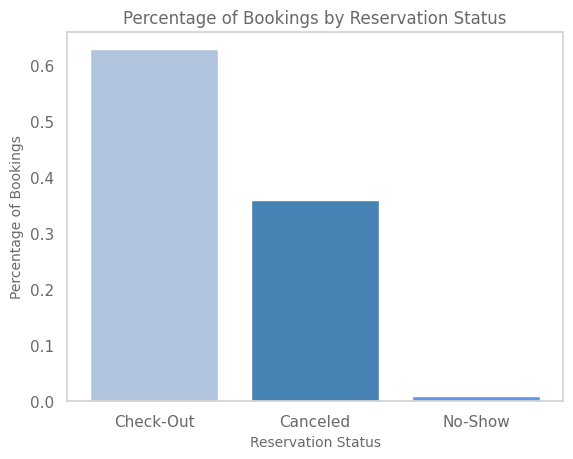

In [ ]:
#Bar chart to visualize the pct of bookings canceled prior to arrival
fig, ax = plt.subplots()

ax.bar(cancellation_status.index, cancellation_status, color=['lightsteelblue', 'steelblue', 'cornflowerblue'])
ax.set_title('Percentage of Bookings by Reservation Status', size=12)
ax.set_xticks(cancellation_status.index)
ax.set_xlabel('Reservation Status', size=10)
ax.set_ylabel('Percentage of Bookings', size=10)

The **reservation_status** variable provides additional information for the Canceled bookings detailing which bookings were **canceled prior to arrival date (36%)** and which bookings **did not check in and did not provide any reason for cancellation (1%)**.

In [ ]:
#Visualizing lead time for canceled and not-canceled bookings
average_lead_time = df.groupby('is_canceled')['lead_time'].mean()
average_lead_time

<ipython-input-39-232661325ad0>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  average_lead_time = df.groupby('is_canceled')['lead_time'].mean()


,lead_time
is_canceled,
0,79.984687
1,144.848815


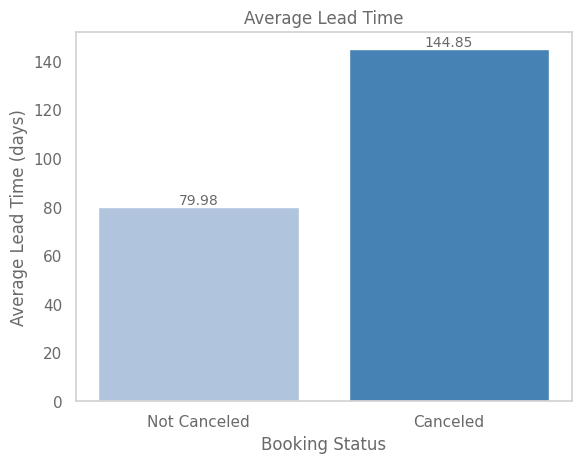

In [ ]:
fig, ax = plt.subplots()

ax.bar(average_lead_time.index, average_lead_time, color=['lightsteelblue', 'steelblue'])
ax.set_title('Average Lead Time')
ax.set_xticks(ticks=[0,1], labels=['Not Canceled','Canceled'])
ax.set_xlabel('Booking Status')
ax.set_ylabel('Average Lead Time (days)')

#display the average lead time on top of each bar
bars = plt.bar([0, 1], average_lead_time, color=['lightsteelblue', 'steelblue'])
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=10)

The **average lead time** for bookings that are **not canceled** is approximately **79.98 days**. The average lead time for bookings that are **canceled** is higher, approximately **144.85 days**.

In [ ]:
#Convert months names to categorical type with a specific order
months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df['arrival_date_month'] = pd.Categorical(df['arrival_date_month'], categories=months_order, ordered=True)

#count the number of bookings  per month
monthly_bookings = df[df['arrival_date_year']==2016]['arrival_date_month'].value_counts().sort_index()

#Count the number of bookings by status (canceled vs. not canceled)
monthly_bookings_canceled = df[(df['is_canceled'] == 1) & (df['arrival_date_year']==2016)]['arrival_date_month'].value_counts().sort_index()
monthly_bookings_not_canceled = df[(df['is_canceled'] == 0) & (df['arrival_date_year']==2016)]['arrival_date_month'].value_counts().sort_index()

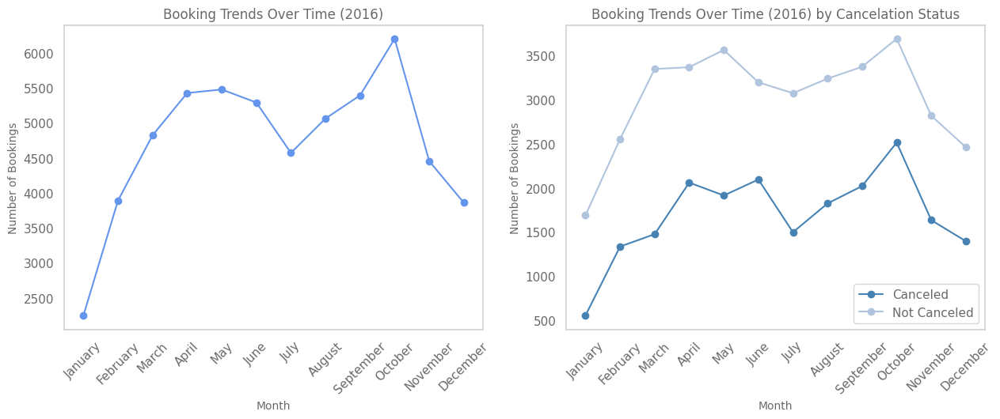

In [ ]:
#Visualizing the number of bookings by date
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
monthly_bookings.plot(kind='line', ax=ax1, marker='o', color='cornflowerblue')
ax1.set_title('Booking Trends Over Time (2016)', fontsize=12)
ax1.set_xlabel('Month', fontsize=10)
ax1.set_ylabel('Number of Bookings', fontsize=10)
ax1.set_xticks(range(len(months_order)))
ax1.set_xticklabels(months_order, rotation=45)

#Visualizing the number of canceled and not-canceled by date
monthly_bookings_canceled.plot(kind='line', ax=ax2, marker='o', color='steelblue', label='Canceled')
monthly_bookings_not_canceled.plot(kind='line', ax=ax2, marker='o', color='lightsteelblue', label='Not Canceled')
ax2.set_title('Booking Trends Over Time (2016) by Cancelation Status', fontsize=12)
ax2.set_xlabel('Month', fontsize=10)
ax2.set_ylabel('Number of Bookings', fontsize=10)
ax2.set_xticks(range(len(months_order)))
ax2.set_xticklabels(months_order, rotation=45)
ax2.legend()

Grapghs just for the whole year of **2016**. Bookings typically peak from **July to September**, where **September** is the month with the highest number of bookings. With a **decline** in **January**. Same patter for both canceled and not canceled bookings.

In [ ]:
#Sorting the number of bookings by date
monthly_bookings = df.groupby(df['arrival_date'].dt.to_period('M')).size()
#Sorting the number of canceled and not-canceled by date
monthly_bookings_status = df.groupby([df['arrival_date'].dt.to_period('M'), 'is_canceled']).size().unstack()

<ipython-input-43-f57369b504bf>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  monthly_bookings_status = df.groupby([df['arrival_date'].dt.to_period('M'), 'is_canceled']).size().unstack()


Text(0, 0.5, 'Number of Bookings')

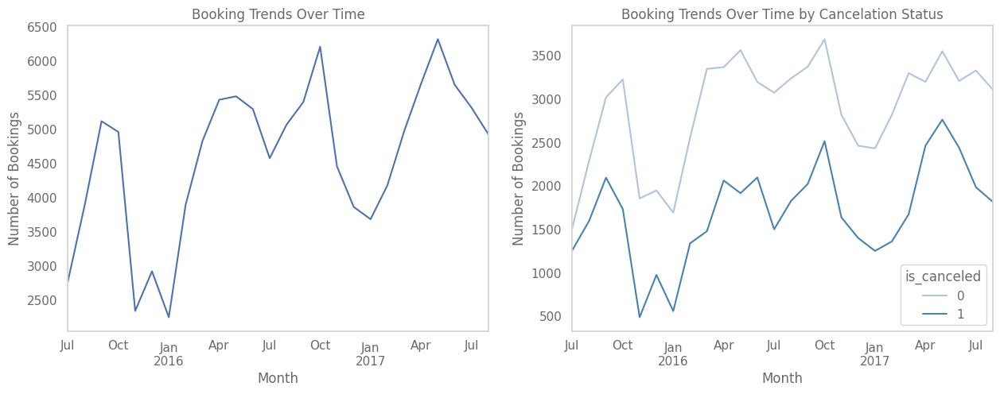

In [ ]:
#Visualizing the number of bookings by date
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
monthly_bookings.plot(kind='line', ax=ax1)
ax1.set_title('Booking Trends Over Time')
ax1.set_xlabel('Month')
ax1.set_ylabel('Number of Bookings')

#Visualizing the number of canceled and not-canceled by date
monthly_bookings_status.plot(kind='line', ax=ax2, color=['lightsteelblue', 'steelblue'])
ax2.set_title('Booking Trends Over Time by Cancelation Status')
ax2.set_xlabel('Month')
ax2.set_ylabel('Number of Bookings')

The previous graphs represents the pattern of bookings during the whole period **July 2015 to August 2017**. For the three years the month with the highest number of bookings is August, with a decline during January. August 2016 and 2017 are relatively similar; however, August 2015 is really low compared with them.

In [ ]:
#Define function to calculate the statistics
def boxplot_statistics(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    num_values = len(data)
    pct_above_upper_bound = round(((data > upper_bound).sum() / num_values)*100, 2)
    pct_below_lower_bound = round(((data < lower_bound).sum() / num_values)*100, 2)
    return {
        'median': data.median(),
        'Q1': Q1,
        'Q3': Q3,
        'IQR': IQR,
        'lower_bound': lower_bound,
        'upper_bound': upper_bound,
        'min': data.min(),
        'max': data.max(),
        'outliers': data[(data < lower_bound) | (data > upper_bound)].count(),
        '% above upper bound': pct_above_upper_bound,
        '% below lower bound': pct_below_lower_bound
    }

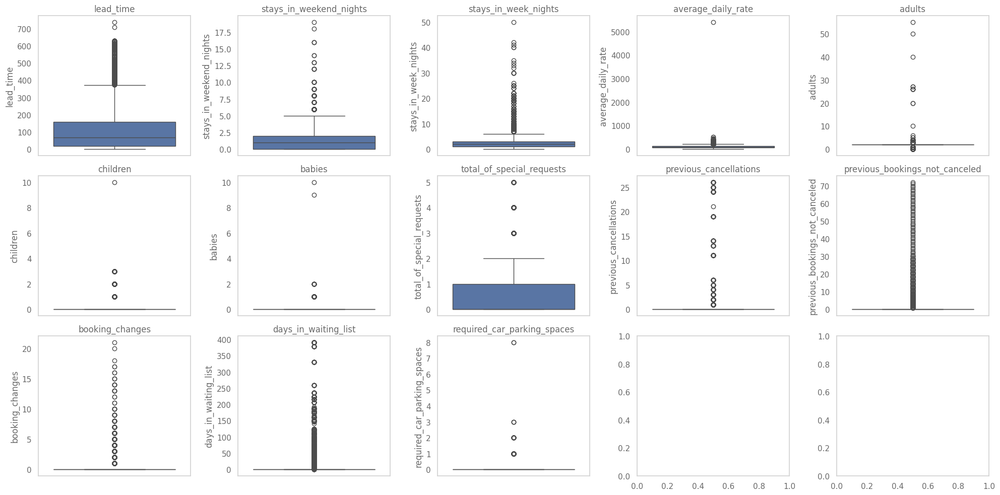

In [ ]:
# Plot box plots for numerical columns
numerical_columns = ['lead_time','stays_in_weekend_nights', 'stays_in_week_nights', 'average_daily_rate','adults', 'children', 'babies',
                     'total_of_special_requests','previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list', 'required_car_parking_spaces']
num_columns = len(numerical_columns)
nrows = 3
ncols = (num_columns // nrows) + (num_columns % nrows > 0)

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 10), sharey=False)
axes = axes.flatten()
# Iterate over each column and its corresponding subplot
for i, column in enumerate(numerical_columns):
    sns.boxplot(data=df[column], ax=axes[i])
    axes[i].set_title(column)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
for i, column in enumerate(numerical_columns):
  print(f"\033[1m{column} Statistics:\033[0m")
  print(boxplot_statistics(df[column]))
  print()

lead_time Statistics:
{'median': 69.0, 'Q1': 18.0, 'Q3': 160.0, 'IQR': 142.0, 'lower_bound': -195.0, 'upper_bound': 373.0, 'min': 0, 'max': 737, 'outliers': 3005, '% above upper bound': 2.52, '% below lower bound': 0.0}

stays_in_weekend_nights Statistics:
{'median': 1.0, 'Q1': 0.0, 'Q3': 2.0, 'IQR': 2.0, 'lower_bound': -3.0, 'upper_bound': 5.0, 'min': 0, 'max': 19, 'outliers': 265, '% above upper bound': 0.22, '% below lower bound': 0.0}

stays_in_week_nights Statistics:
{'median': 2.0, 'Q1': 1.0, 'Q3': 3.0, 'IQR': 2.0, 'lower_bound': -2.0, 'upper_bound': 6.0, 'min': 0, 'max': 50, 'outliers': 3354, '% above upper bound': 2.81, '% below lower bound': 0.0}

average_daily_rate Statistics:
{'median': 94.575, 'Q1': 69.29, 'Q3': 126.0, 'IQR': 56.709999999999994, 'lower_bound': -15.774999999999991, 'upper_bound': 211.065, 'min': -6.38, 'max': 5400.0, 'outliers': 3793, '% above upper bound': 3.18, '% below lower bound': 0.0}

adults Statistics:
{'median': 2.0, 'Q1': 2.0, 'Q3': 2.0, 'IQR': 0.0

- The median **lead time** is 69 day. Some outliers extend beyond this median (2.52%), with the maximum lead time reaching up to 737 days.
- **Weekend nights stay** shows a median of 1 night, with a concentration of 0 and 2 nights, with a maximum of 19 nights, with a few proportion of outliers (0.22%).
- **Weeknight stay** has a higher median stay of 2 nights with a range from 1 to 3 nights, with 2.81% outliers between 6 to 50 nights.
- **previous_cancellation** has a median of 0 with the maximum value reaches 26.
- **previous_booking_not_cancelled** has a median of 0 with a maximum value of 72 and 3.03% of the data points being outliers.
- **booking_changes** with a median of 0, 15.14% of data points present 1 or more changes, where the maximum changes of the booking are up to 21 changes.
- **days_in_waiting_list** with a median of 0, it has 3.1% of data points classified as outliers with a maximum of 391 days in waiting list.
- **required_car_parking_spaces** with a median of 0, the maximum value is 8 and 6.21% of data points accounting for 1 or more parking spaces.
- **total_of_special_requests** with a median of 0, Q1 at 0, and Q3 at 1. The upper bound is 2.5, and the maximum value is 5, with 2.41% of data points exceeding the upper bound.


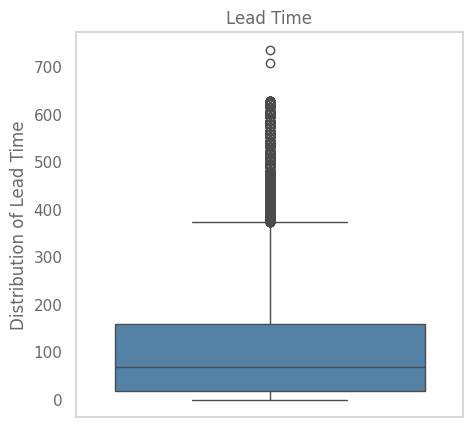

In [ ]:
#Visualizing the distribution of leadtime
plt.figure(figsize=(5,5))
sns.boxplot(y='lead_time', data=df, color='steelblue')
plt.title('Lead Time')
plt.ylabel('Distribution of Lead Time')
plt.show()

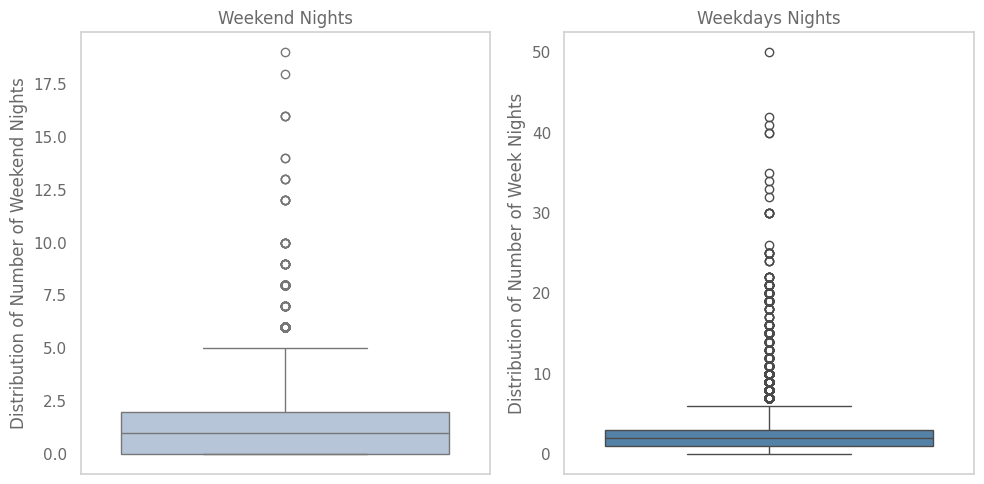

In [ ]:
#Visualizing the distribution of stays in weekend nights vs. weekdays nights
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.boxplot(y=df['stays_in_weekend_nights'], color='lightsteelblue')
plt.title('Weekend Nights')
plt.ylabel('Distribution of Number of Weekend Nights')


plt.subplot(1, 2, 2)
sns.boxplot(y='stays_in_week_nights', data=df, color='steelblue')
plt.title('Weekdays Nights')
plt.ylabel('Distribution of Number of Week Nights')

plt.tight_layout()
plt.show()

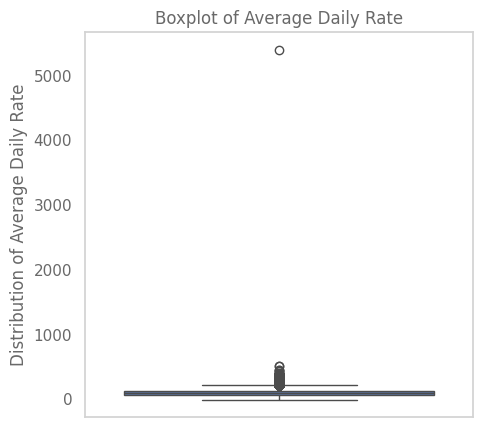

In [ ]:
#Visualizing the distribution of average daily rate
plt.figure(figsize=(5, 5))
sns.boxplot(y='average_daily_rate', data=df)
plt.title('Boxplot of Average Daily Rate')
plt.ylabel('Distribution of Average Daily Rate')
plt.show()

In [ ]:
import matplotlib.colors as mcolors
blue_scale = mcolors.LinearSegmentedColormap.from_list("blue_scale", ["lightsteelblue", "navy"])

<ipython-input-52-c321c38ec8c6>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df.groupby(['is_canceled', column]).size().unstack(fill_value=0)
<ipython-input-52-c321c38ec8c6>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df.groupby(['is_canceled', column]).size().unstack(fill_value=0)
<ipython-input-52-c321c38ec8c6>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellatio

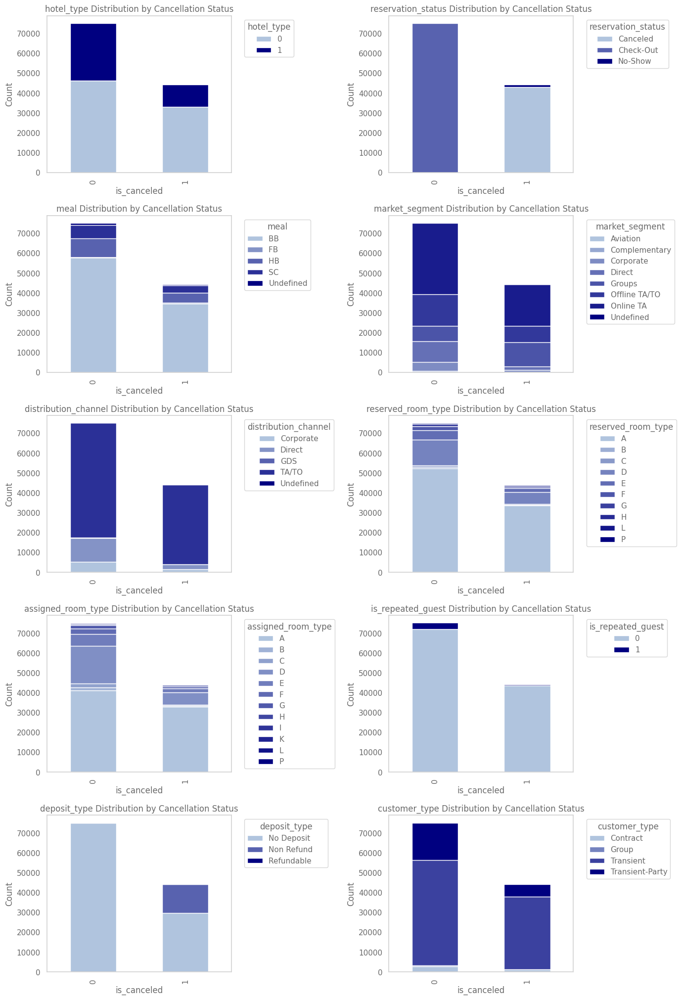

In [ ]:
categorical_columns = ['hotel_type', 'reservation_status' , 'meal', 'market_segment', 'distribution_channel', 'reserved_room_type',
                       'assigned_room_type', 'is_repeated_guest', 'deposit_type', 'customer_type']

fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(14, 28))
axes = axes.flatten()

for i, column in enumerate(categorical_columns):
    # Calculate the counts of is_canceled for each category within the column
    cancellation_dist = df.groupby(['is_canceled', column]).size().unstack(fill_value=0)

    # Plot the stacked bar chart
    cancellation_dist.plot(kind='bar', stacked=True, ax=axes[i], colormap=blue_scale)

    # Customize the plot
    axes[i].set_title(f'{column} Distribution by Cancellation Status')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('is_canceled')
    axes[i].legend(title=column, bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
#Check deposit option for customer that cancel
df[df['is_canceled']==1]['deposit_type'].value_counts(normalize=True)

,proportion
deposit_type,
No Deposit,0.671445
Non Refund,0.327741
Refundable,0.000814


In [ ]:
#Check deposit option for customer that cancel
df[df['is_canceled']==0]['deposit_type'].value_counts(normalize=True)

,proportion
deposit_type,
No Deposit,0.997086
Refundable,0.001676
Non Refund,0.001237


* 99% of customers who do not cancel their bookings select the ‘No Deposit’ option. In contrast, customers who do cancel, 67% also choose ‘No Deposit’, while 32% opt for ‘No Refundable’ option.


<ipython-input-55-44744d834a6e>:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df_vis.groupby(['is_canceled', column]).size().unstack(fill_value=0)


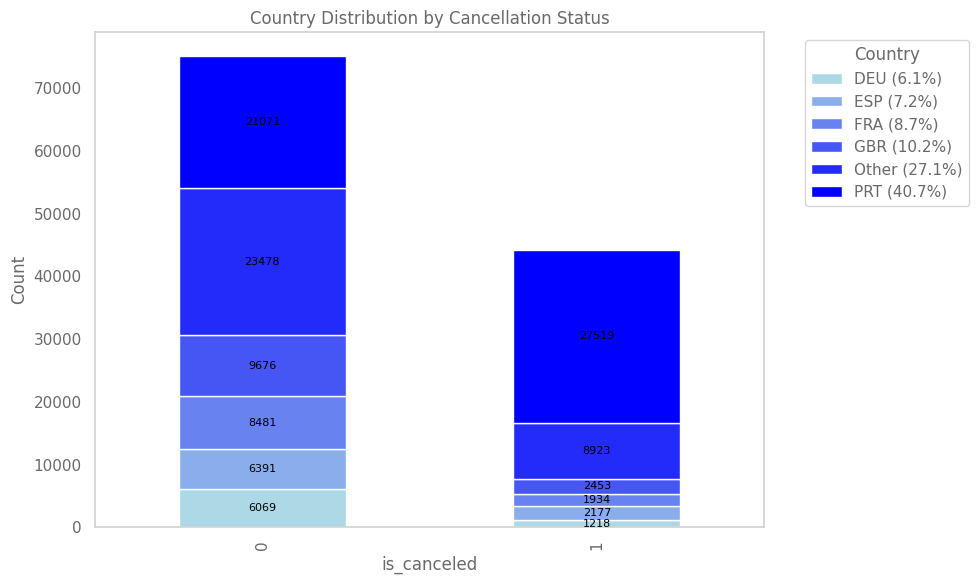

<ipython-input-55-44744d834a6e>:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df_vis.groupby(['is_canceled', column]).size().unstack(fill_value=0)


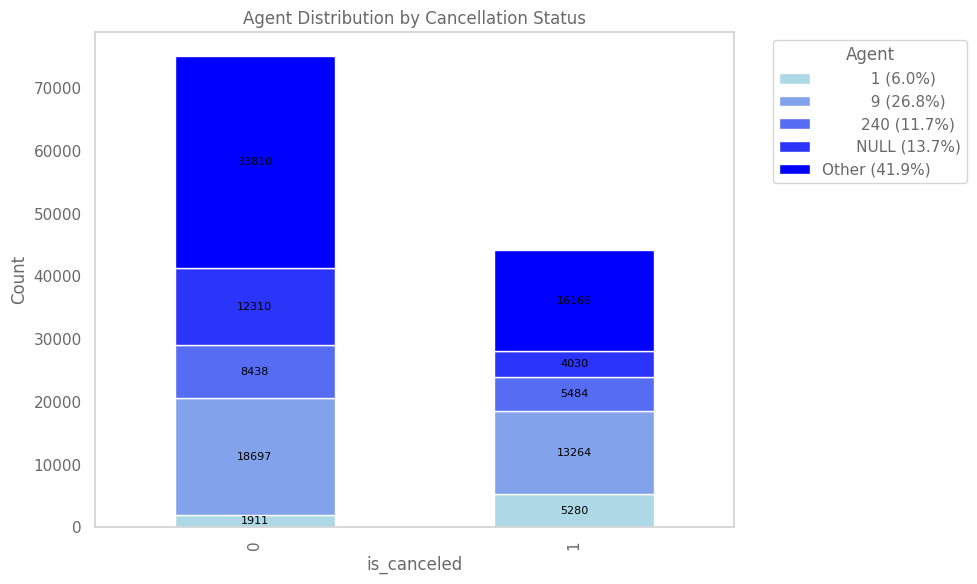

<ipython-input-55-44744d834a6e>:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df_vis.groupby(['is_canceled', column]).size().unstack(fill_value=0)


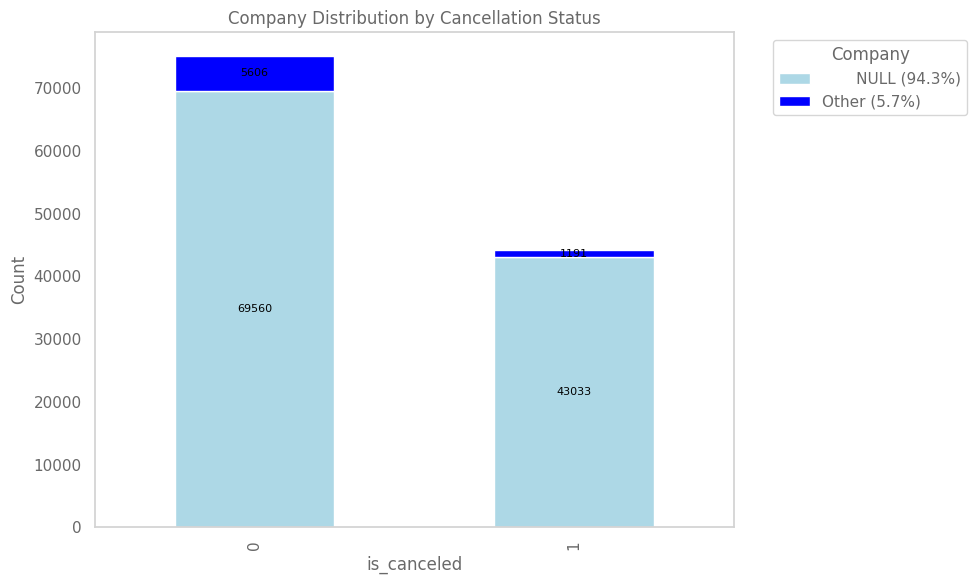

In [ ]:
# Categorical columns
categorical_columns = ['country', 'agent', 'company']

# Function to plot bar chart for each categorical variable
def plot_categorical_distribution(df, column):
    # Make a copy of the DataFrame for visualization purposes
    df_vis = df.copy()

    #Handle NaN values
    df_vis[column].fillna('Unknown', inplace=True)

    # Count the occurrences of each category within the column
    counts = df_vis[column].value_counts()

    # Identify the categories that make up less than a certain threshold (e.g., 1%) and group them into "Other"
    threshold = 0.05
    mask = counts / counts.sum() < threshold
    df_vis[column] = df_vis[column].apply(lambda x: 'Other' if mask.get(x, False) else x)

    # Recalculate the counts after grouping "Other"
    counts_vis = df_vis[column].value_counts()

    # Calculate the counts of is_canceled for each category within the column
    cancellation_dist = df_vis.groupby(['is_canceled', column]).size().unstack(fill_value=0)

    # Create a blue scale colormap
    blue_scale = mcolors.LinearSegmentedColormap.from_list("blue_scale", ["lightblue", "blue"])

    # Plot the stacked bar chart with the blue scale colormap
    ax = cancellation_dist.plot(kind='bar', stacked=True, colormap=blue_scale, figsize=(10, 6))

    # Customize the plot
    ax.set_title(f'{column.capitalize()} Distribution by Cancellation Status')
    ax.set_ylabel('Count')
    ax.set_xlabel('is_canceled')

    # Calculate the percentage for each category
    category_totals = cancellation_dist.sum(axis=0)
    percentages = (category_totals / category_totals.sum()) * 100

    # Customize legend with percentages
    handles, labels = ax.get_legend_handles_labels()
    new_labels = [f'{label} ({percentages.get(label, 0):.1f}%)' for label in labels]
    ax.legend(handles, new_labels, title=column.capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add counts on the bars
    for p in ax.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        if height > 0:  # Only show text for significant proportions
            ax.text(x + width / 2, y + height / 2, f'{int(height)}', ha='center', va='center', fontsize=8, color='black')

    plt.tight_layout()
    plt.show()

# Plot for each categorical column
for column in categorical_columns:
    plot_categorical_distribution(df, column)

# Correlation

In [ ]:
numeric_df = df[['lead_time', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
                         'babies', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list',
                         'average_daily_rate', 'required_car_parking_spaces', 'total_of_special_requests', 'is_canceled' ]]

In [ ]:
corr = numeric_df.corr()

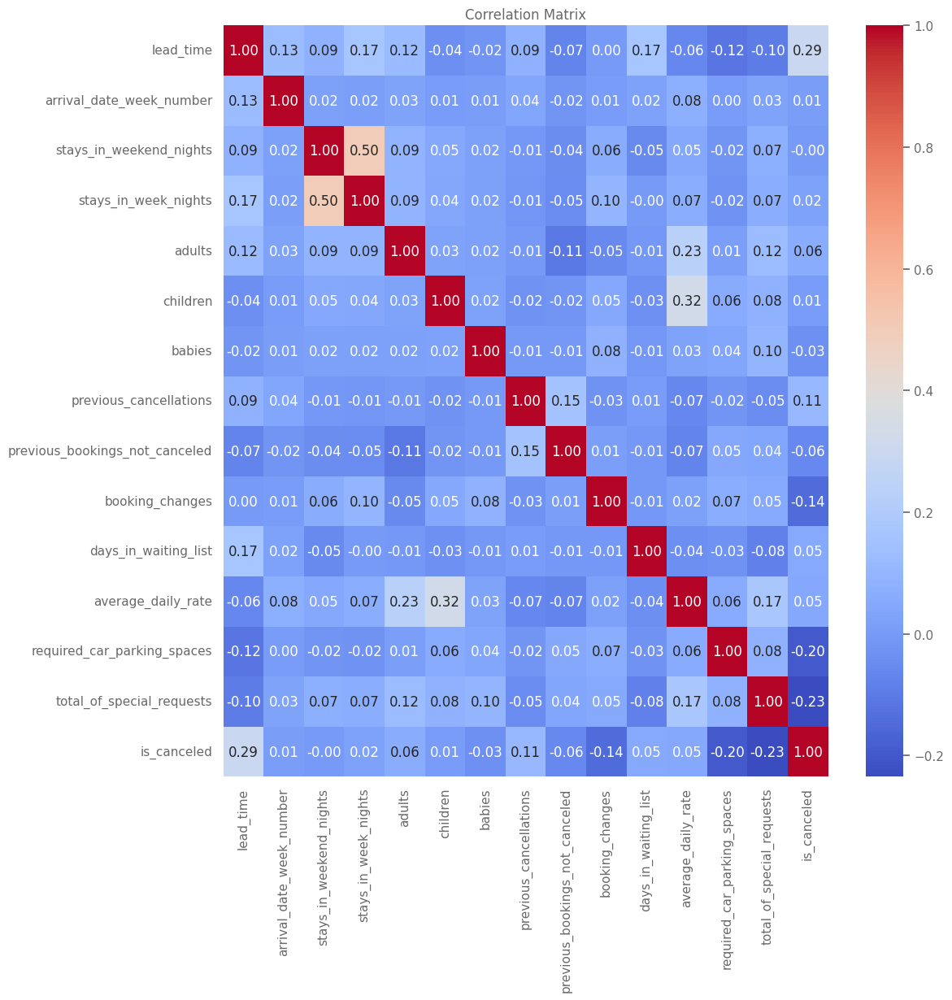

In [ ]:
plt.figure(figsize=(12,12))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

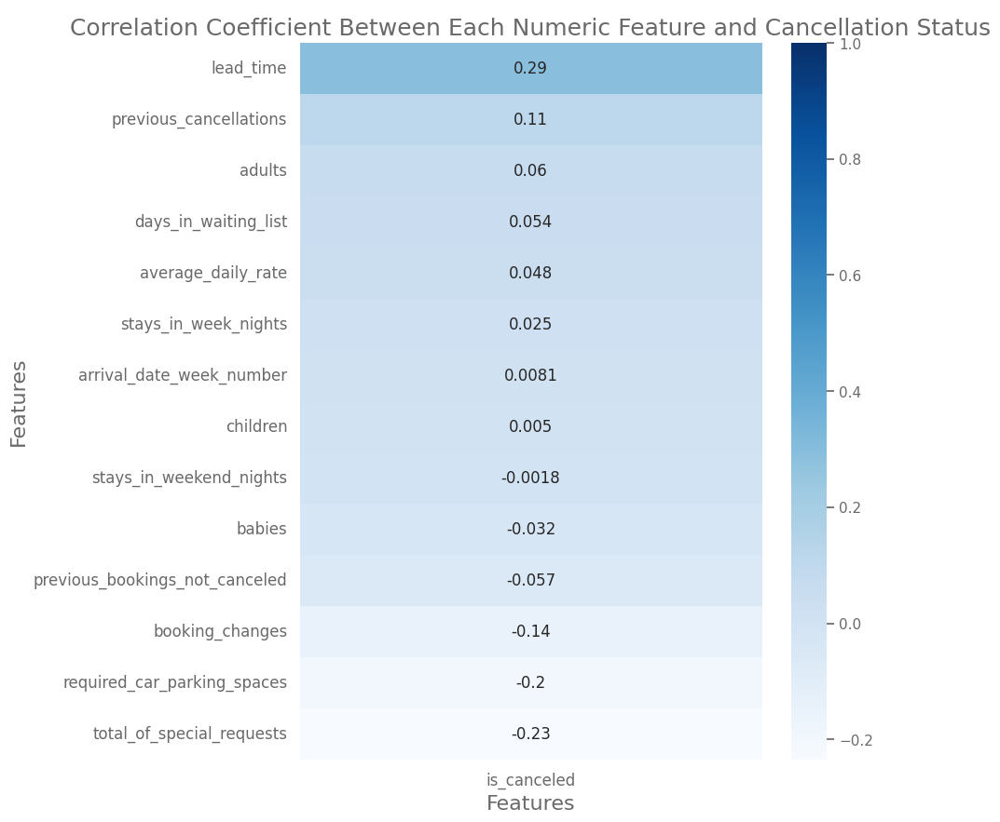

In [ ]:
fig = plt.figure(figsize=(8,10))
ax = sns.heatmap(corr[['is_canceled']].sort_values('is_canceled', ascending=False), annot = True, annot_kws = {"size":12}, cmap='Blues')
ax.set_title('Correlation Coefficient Between Each Numeric Feature and Cancellation Status', fontsize=18)
ax.set_xlabel('Features', fontsize = 16)
ax.set_ylabel('Features', fontsize = 16)
ax.tick_params(axis = "both", labelsize = 12);
y_min, y_max = ax.get_ylim()
ax.set_ylim(top=y_max+1);

- **lead_time** is the most highly correlated feature with whether a booking is canceled, with a correlation of 0.29. this is expected as a longer lead times increases the likelihood of unforeseen circumstances impacting travel plans, thereby contributing to higher cancellation rates.
- **total_of_special_requests** shows the second feature with the strongest correlation (-0.23) with booking cancellation. The likelihood of cancellation decreases as the number of special requests increases. This suggests that fulfilling the special needs may reduce the probability of a customer cancelling their reservation. Related to special requests.
- **required_car_parking_spaces** is the third feature with the strongest correlation (-0.2), suggesting that as the number of parking requests increases, the likelihood of cancellation decreases.


In [ ]:
categorical_cols = ['hotel_type', 'is_canceled', 'meal', 'country', 'market_segment', 'distribution_channel',
                     'is_repeated_guest', 'reserved_room_type', 'assigned_room_type', 'deposit_type', 'agent',
                     'company', 'customer_type', 'reservation_status']

In [ ]:
def chi2_correlation(df, categorical_cols):
  results = []
  pairs = set()
  for col1 in categorical_cols:
    for col2 in categorical_cols:
      if col1 != col2 and (col2, col1) not in pairs:
        contingency_table = pd.crosstab(df[col1], df[col2])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        result = {'Column1': col1,
                   'Column2': col2,
                   'Chi2': chi2,
                   'P-value': p
                   }
        results.append(result)
        pairs.add((col1, col2))
  return pd.DataFrame(results)

In [ ]:
chi2_results = chi2_correlation(df, categorical_cols)
chi2_results.sort_values(by='Chi2', ascending=False).head(10)

,Column1,Column2,Chi2,P-value
70,reserved_room_type,assigned_room_type,647641.848159,0.0
85,agent,company,334877.545769,0.0
51,market_segment,agent,330485.562898,0.0
42,country,agent,292810.806970,0.0
52,market_segment,company,252673.903897,0.0
59,distribution_channel,agent,244875.902872,0.0
46,market_segment,distribution_channel,228659.922341,0.0
24,is_canceled,reservation_status,119390.000000,0.0
32,meal,agent,115279.801211,0.0
78,assigned_room_type,company,100740.215047,0.0


# Missing Data

In [ ]:
df.isnull().sum()

,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0
children,0


In [ ]:
imputer = SimpleImputer(strategy='most_frequent')

In [ ]:
df_cleaned  = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

In [ ]:
for col in df_cleaned.columns:
  df_cleaned[col] = df_cleaned[col].astype(original_dtypes[col])

In [ ]:
df_cleaned.isnull().sum().sum()

0

**488 missing values** for the variable **Country**, which were imputed with the most frequent value, for this case the 488 values were changed to “Portugal”

In [ ]:
#Remove the spaces
df_cleaned['company'] = df_cleaned['company'].str.strip()
df_cleaned['agent'] = df_cleaned['agent'].str.strip()

In [ ]:
#Checking the number of entries with company = 'NULL'
df_cleaned[(df_cleaned['company']=='NULL')].shape

(112593, 33)

In [ ]:
#Checking the number of entries with agent = 'NULL'
df_cleaned[(df_cleaned['agent']=='NULL')].shape

(16340, 33)

For the variables **agent** and **company** some entries were labeled as ‘NULL’, indicating bookings were not made through an agent or company. Those entries will not consider as missing values.

In [ ]:
df_cleaned.shape

(119390, 33)

# Balance Dataset - Downsampling

In [ ]:
#Check if the dataset is balanced
df_cleaned['is_canceled'].value_counts(normalize=True)

,proportion
is_canceled,
0,0.629584
1,0.370416


In [ ]:
#Separate the majority and minority classes
df_canceled = df_cleaned[df_cleaned['is_canceled'] == 1]
df_not_canceled = df_cleaned[df_cleaned['is_canceled'] == 0]

In [ ]:
#Dowsample the majority class. Reduce the size of canceled dataset to the size of minority class
#replace=False -> sample without replacement
df_not_canceled_dowsampled = resample(df_not_canceled,
                                      replace=False,
                                      n_samples=len(df_canceled),
                                      random_state=301314502)

In [ ]:
#Combine the downsample dataset with the minority dataset
df_balanced = pd.concat([df_canceled, df_not_canceled_dowsampled])

In [ ]:
#Ensure the rows are randomized
df_balanced = df_balanced.sample(frac=1, random_state=301314502).reset_index(drop=True)

In [ ]:
#Verify the balance
df_balanced['is_canceled'].value_counts()

,count
is_canceled,
0,44224
1,44224


In [ ]:
df_balanced.shape

(88448, 33)

**Downsampling Technique** was used to address the challenge of working with an imbalanced dataset, 37% of entries were classified as 1 ‘Canceled’ and 63% were classified as 0 ‘Not-Canceled’ bookings. Where the number of instances for 'Not-Canceled' bookings were reduced to match the number of instances for the minority class 'Canceled' bookings.

# Visualization - After Dowsampling

In [ ]:
#Distribution of the target variable (is_canceled) to check for unbalanced dataset
bookings_status_pct = df_balanced['is_canceled'].value_counts(normalize=True)
bookings_status_pct

,proportion
is_canceled,
0,0.5
1,0.5


Text(0, 0.5, 'Percentage of Bookings')

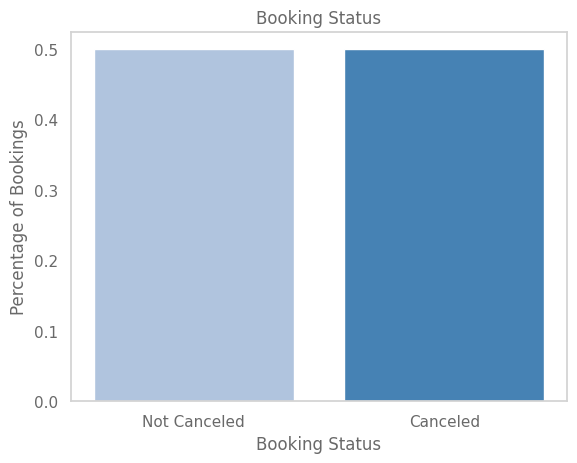

In [ ]:
#Bar chart to visualize the pct of canceled vs. no canceled bookings
fig, ax = plt.subplots()

ax.bar(bookings_status_pct.index, bookings_status_pct, color=['lightsteelblue', 'steelblue'])
ax.set_title('Booking Status')
ax.set_xticks(ticks=[0,1], labels=['Not Canceled', 'Canceled'])
ax.set_xlabel('Booking Status')
ax.set_ylabel('Percentage of Bookings')

In [ ]:
#Visualizing the distribution of bookings canceled Status
cancellation_status = df_balanced['reservation_status'].value_counts(normalize=True)
cancellation_status

,proportion
reservation_status,
Check-Out,0.500000
Canceled,0.486354
No-Show,0.013646


In [ ]:
#96% of the overall canceled bookings are canceled prior to arrival, 4% of bookings were not check-in and did not provide a reason for cancellation

Text(0, 0.5, 'Percentage of Bookings')

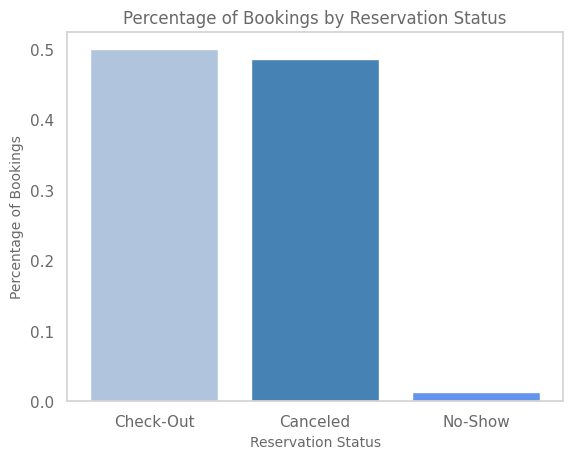

In [ ]:
#Bar chart to visualize the pct of bookings canceled prior to arrival
fig, ax = plt.subplots()

ax.bar(cancellation_status.index, cancellation_status, color=['lightsteelblue', 'steelblue', 'cornflowerblue'])
ax.set_title('Percentage of Bookings by Reservation Status', size=12)
ax.set_xticks(cancellation_status.index)
ax.set_xlabel('Reservation Status', size=10)
ax.set_ylabel('Percentage of Bookings', size=10)

In [ ]:
#Visualizing lead time for canceled and not-canceled bookings
average_lead_time = df_balanced.groupby('is_canceled')['lead_time'].mean()
average_lead_time

<ipython-input-84-f2640de6f4e4>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  average_lead_time = df_balanced.groupby('is_canceled')['lead_time'].mean()


,lead_time
is_canceled,
0,80.086695
1,144.848815


In [ ]:
#Canceled bookings have a longer lead time, 105.72 days.

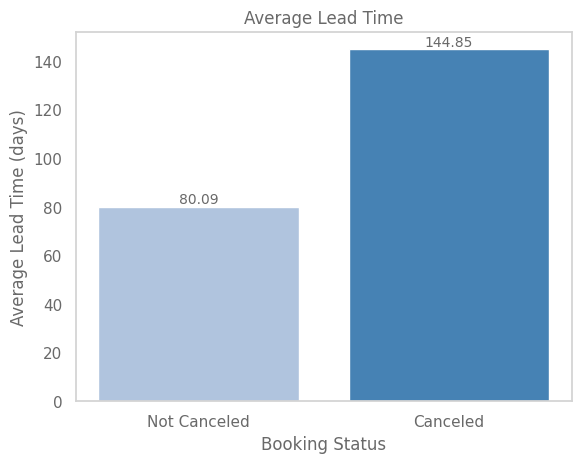

In [ ]:
fig, ax = plt.subplots()

ax.bar(average_lead_time.index, average_lead_time, color=['lightsteelblue', 'steelblue'])
ax.set_title('Average Lead Time')
ax.set_xticks(ticks=[0,1], labels=['Not Canceled','Canceled'])
ax.set_xlabel('Booking Status')
ax.set_ylabel('Average Lead Time (days)')

#display the average lead time on top of each bar
bars = plt.bar([0, 1], average_lead_time, color=['lightsteelblue', 'steelblue'])
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=10)

In [ ]:
#Convert months names to categorical type with a specific order
months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_balanced['arrival_date_month'] = pd.Categorical(df_balanced['arrival_date_month'], categories=months_order, ordered=True)

#count the number of bookings  per month
monthly_bookings = df_balanced['arrival_date_month'].value_counts().sort_index()

#Count the number of bookings by status (canceled vs. not canceled)
monthly_bookings_canceled = df_balanced[df_balanced['is_canceled'] == 1]['arrival_date_month'].value_counts().sort_index()
monthly_bookings_not_canceled = df_balanced[df_balanced['is_canceled'] == 0]['arrival_date_month'].value_counts().sort_index()

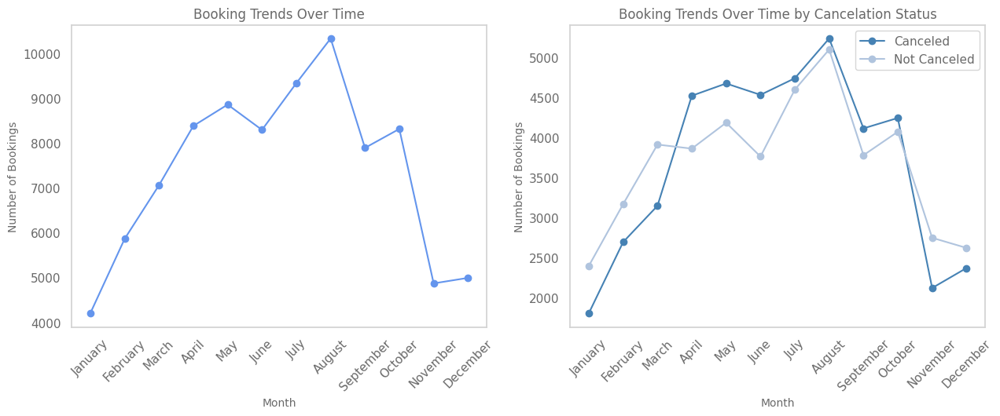

In [ ]:
#Visualizing the number of bookings by date
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
monthly_bookings.plot(kind='line', ax=ax1, marker='o', color='cornflowerblue')
ax1.set_title('Booking Trends Over Time', fontsize=12)
ax1.set_xlabel('Month', fontsize=10)
ax1.set_ylabel('Number of Bookings', fontsize=10)
ax1.set_xticks(range(len(months_order)))
ax1.set_xticklabels(months_order, rotation=45)

#Visualizing the number of canceled and not-canceled by date
monthly_bookings_canceled.plot(kind='line', ax=ax2, marker='o', color='steelblue', label='Canceled')
monthly_bookings_not_canceled.plot(kind='line', ax=ax2, marker='o', color='lightsteelblue', label='Not Canceled')
ax2.set_title('Booking Trends Over Time by Cancelation Status', fontsize=12)
ax2.set_xlabel('Month', fontsize=10)
ax2.set_ylabel('Number of Bookings', fontsize=10)
ax2.set_xticks(range(len(months_order)))
ax2.set_xticklabels(months_order, rotation=45)
ax2.legend()

In [ ]:
#Sorting the number of bookings by date
monthly_bookings = df_balanced.groupby(df_balanced['arrival_date'].dt.to_period('M')).size()
#Sorting the number of canceled and not-canceled by date
monthly_bookings_status = df.groupby([df_balanced['arrival_date'].dt.to_period('M'), 'is_canceled']).size().unstack()

<ipython-input-89-20dc4c12bd63>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  monthly_bookings_status = df.groupby([df_balanced['arrival_date'].dt.to_period('M'), 'is_canceled']).size().unstack()


Text(0, 0.5, 'Number of Bookings')

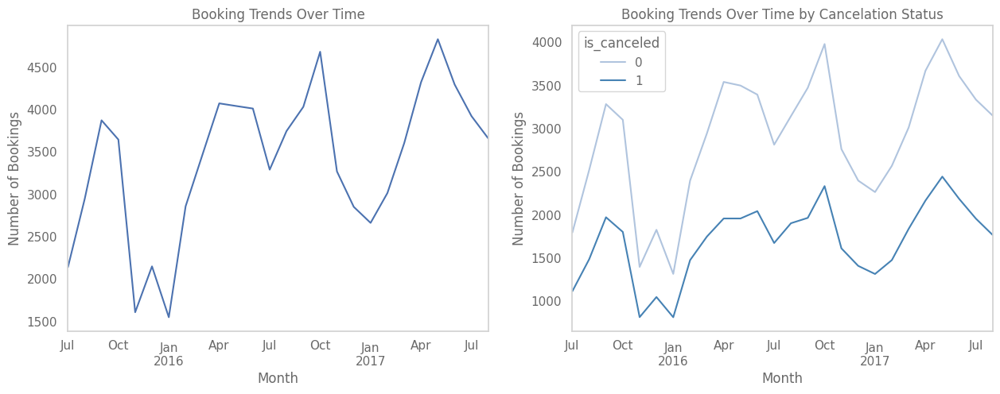

In [ ]:
#Visualizing the number of bookings by date
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
monthly_bookings.plot(kind='line', ax=ax1)
ax1.set_title('Booking Trends Over Time')
ax1.set_xlabel('Month')
ax1.set_ylabel('Number of Bookings')

#Visualizing the number of canceled and not-canceled by date
monthly_bookings_status.plot(kind='line', ax=ax2, color=['lightsteelblue', 'steelblue'])
ax2.set_title('Booking Trends Over Time by Cancelation Status')
ax2.set_xlabel('Month')
ax2.set_ylabel('Number of Bookings')

In [ ]:
#Bookings typically peak from June to August, with a noticeable decline in January

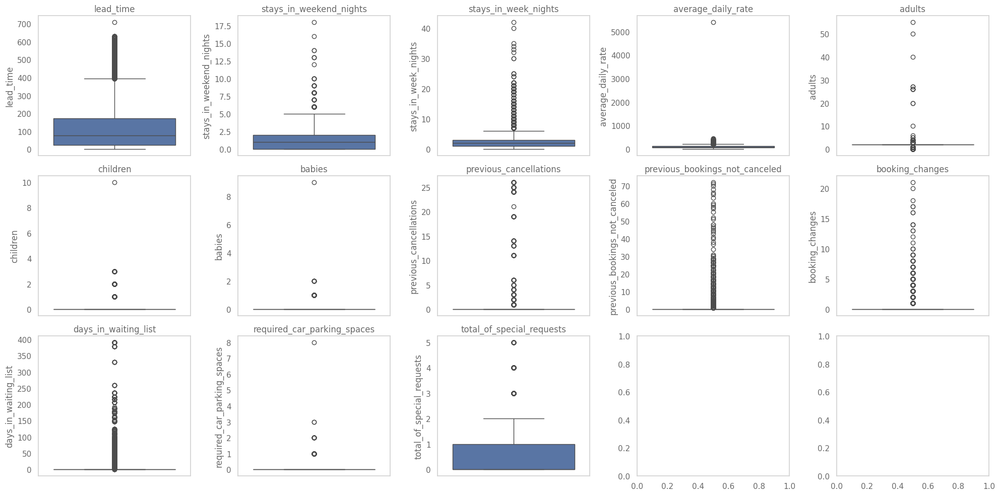

In [ ]:
# Plot box plots for numerical columns
numerical_columns = ['lead_time','stays_in_weekend_nights', 'stays_in_week_nights', 'average_daily_rate','adults', 'children', 'babies',
                     'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list', 'required_car_parking_spaces', 'total_of_special_requests']
num_columns = len(numerical_columns)
nrows = 3
ncols = (num_columns // nrows) + (num_columns % nrows > 0)

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 10), sharey=False)
axes = axes.flatten()
# Iterate over each column and its corresponding subplot
for i, column in enumerate(numerical_columns):
    sns.boxplot(data=df_balanced[column], ax=axes[i])
    axes[i].set_title(column)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
for i, column in enumerate(numerical_columns):
  print(f"\033[1m{column} Statistics:\033[0m")
  print(boxplot_statistics(df_balanced[column]))
  print()

lead_time Statistics:
{'median': 78.0, 'Q1': 23.0, 'Q3': 171.0, 'IQR': 148.0, 'lower_bound': -199.0, 'upper_bound': 393.0, 'min': 0, 'max': 709, 'outliers': 2016, '% above upper bound': 2.28, '% below lower bound': 0.0}

stays_in_weekend_nights Statistics:
{'median': 1.0, 'Q1': 0.0, 'Q3': 2.0, 'IQR': 2.0, 'lower_bound': -3.0, 'upper_bound': 5.0, 'min': 0, 'max': 18, 'outliers': 217, '% above upper bound': 0.25, '% below lower bound': 0.0}

stays_in_week_nights Statistics:
{'median': 2.0, 'Q1': 1.0, 'Q3': 3.0, 'IQR': 2.0, 'lower_bound': -2.0, 'upper_bound': 6.0, 'min': 0, 'max': 42, 'outliers': 2462, '% above upper bound': 2.78, '% below lower bound': 0.0}

average_daily_rate Statistics:
{'median': 95.0, 'Q1': 70.0, 'Q3': 126.0, 'IQR': 56.0, 'lower_bound': -14.0, 'upper_bound': 210.0, 'min': -6.38, 'max': 5400.0, 'outliers': 2889, '% above upper bound': 3.27, '% below lower bound': 0.0}

adults Statistics:
{'median': 2.0, 'Q1': 2.0, 'Q3': 2.0, 'IQR': 0.0, 'lower_bound': 2.0, 'upper_boun

<ipython-input-94-e84cb735c992>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df_balanced.groupby(['is_canceled', column]).size().unstack(fill_value=0)
<ipython-input-94-e84cb735c992>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df_balanced.groupby(['is_canceled', column]).size().unstack(fill_value=0)
<ipython-input-94-e84cb735c992>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warn

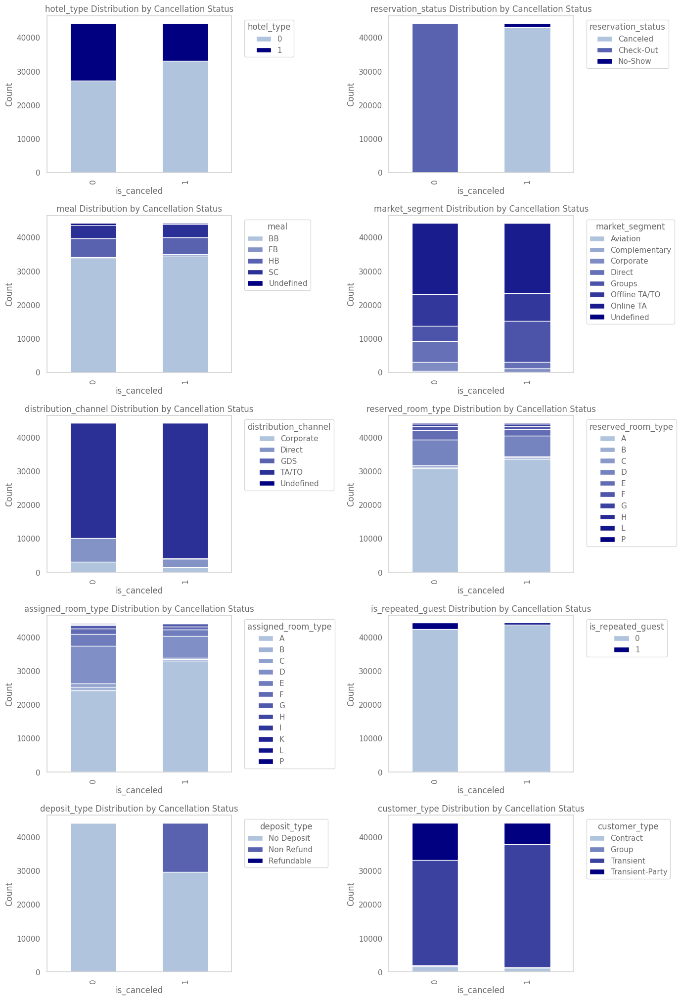

In [ ]:
categorical_columns = ['hotel_type', 'reservation_status' , 'meal', 'market_segment', 'distribution_channel', 'reserved_room_type',
                       'assigned_room_type', 'is_repeated_guest', 'deposit_type', 'customer_type']

fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(14, 28))
axes = axes.flatten()

for i, column in enumerate(categorical_columns):
    # Calculate the counts of is_canceled for each category within the column
    cancellation_dist = df_balanced.groupby(['is_canceled', column]).size().unstack(fill_value=0)

    # Plot the stacked bar chart
    cancellation_dist.plot(kind='bar', stacked=True, ax=axes[i], colormap=blue_scale)

    # Customize the plot
    axes[i].set_title(f'{column} Distribution by Cancellation Status')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('is_canceled')
    axes[i].legend(title=column, bbox_to_anchor=(1.05, 1), loc='upper left')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

<ipython-input-95-c0fd91fe635d>:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df_vis.groupby(['is_canceled', column]).size().unstack(fill_value=0)


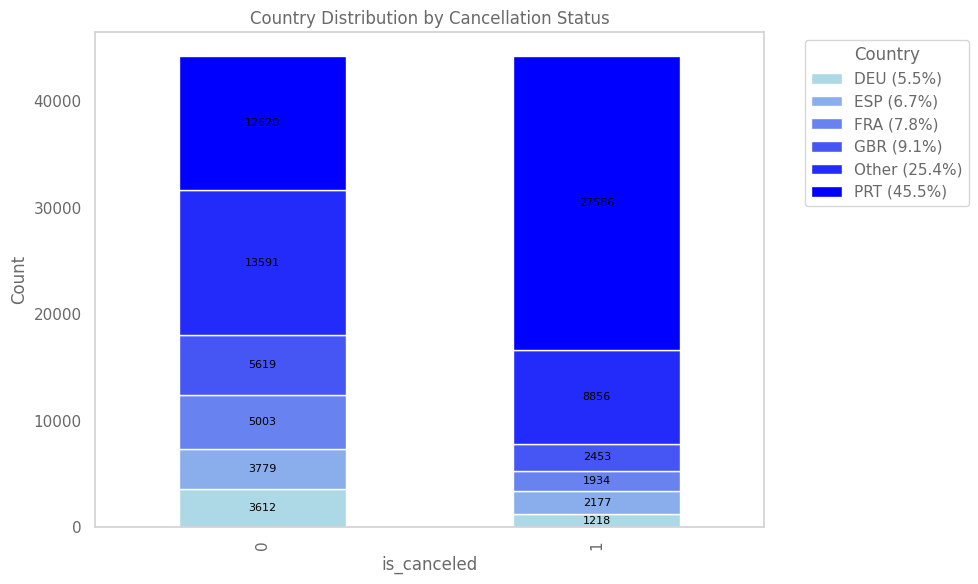

<ipython-input-95-c0fd91fe635d>:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df_vis.groupby(['is_canceled', column]).size().unstack(fill_value=0)


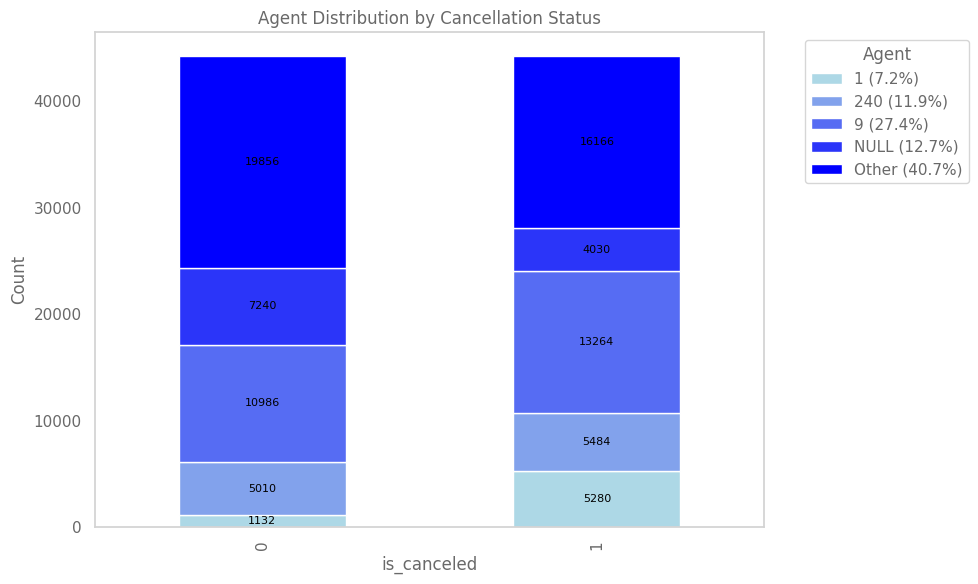

<ipython-input-95-c0fd91fe635d>:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cancellation_dist = df_vis.groupby(['is_canceled', column]).size().unstack(fill_value=0)


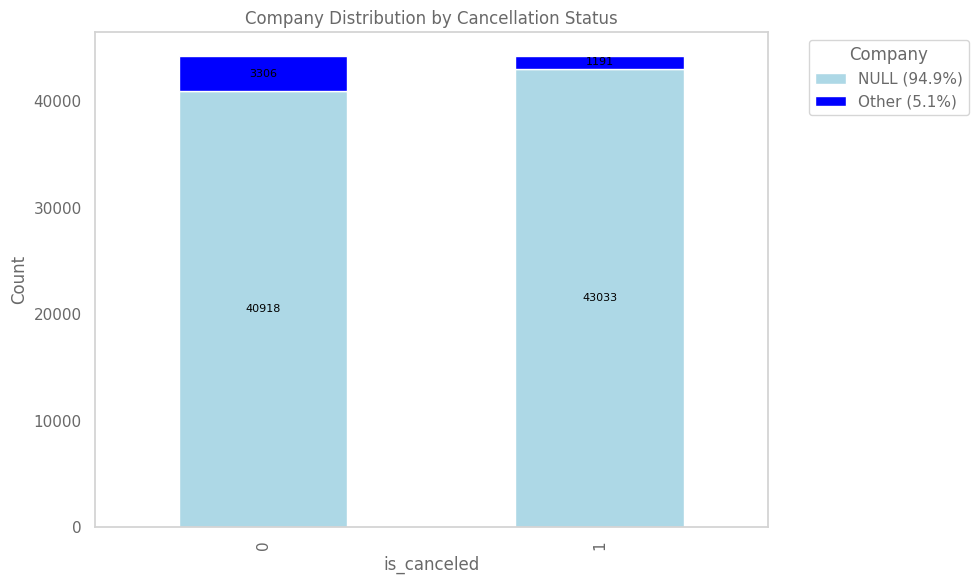

In [ ]:
# Categorical columns
categorical_columns = ['country', 'agent', 'company']

# Function to plot bar chart for each categorical variable
def plot_categorical_distribution(df, column):
    # Make a copy of the DataFrame for visualization purposes
    df_vis = df.copy()

    #Handle NaN values
    df_vis[column].fillna('Unknown', inplace=True)

    # Count the occurrences of each category within the column
    counts = df_vis[column].value_counts()

    # Identify the categories that make up less than a certain threshold (e.g., 1%) and group them into "Other"
    threshold = 0.05
    mask = counts / counts.sum() < threshold
    df_vis[column] = df_vis[column].apply(lambda x: 'Other' if mask.get(x, False) else x)

    # Recalculate the counts after grouping "Other"
    counts_vis = df_vis[column].value_counts()

    # Calculate the counts of is_canceled for each category within the column
    cancellation_dist = df_vis.groupby(['is_canceled', column]).size().unstack(fill_value=0)

    # Create a blue scale colormap
    blue_scale = mcolors.LinearSegmentedColormap.from_list("blue_scale", ["lightblue", "blue"])

    # Plot the stacked bar chart with the blue scale colormap
    ax = cancellation_dist.plot(kind='bar', stacked=True, colormap=blue_scale, figsize=(10, 6))

    # Customize the plot
    ax.set_title(f'{column.capitalize()} Distribution by Cancellation Status')
    ax.set_ylabel('Count')
    ax.set_xlabel('is_canceled')

    # Calculate the percentage for each category
    category_totals = cancellation_dist.sum(axis=0)
    percentages = (category_totals / category_totals.sum()) * 100

    # Customize legend with percentages
    handles, labels = ax.get_legend_handles_labels()
    new_labels = [f'{label} ({percentages.get(label, 0):.1f}%)' for label in labels]
    ax.legend(handles, new_labels, title=column.capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add counts on the bars
    for p in ax.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        if height > 0:  # Only show text for significant proportions
            ax.text(x + width / 2, y + height / 2, f'{int(height)}', ha='center', va='center', fontsize=8, color='black')

    plt.tight_layout()
    plt.show()

# Plot for each categorical column
for column in categorical_columns:
    plot_categorical_distribution(df_balanced, column)

# Handling Outliers

In [ ]:
#Cap and floor, replacing outliers with the median
numerical_columns = ['lead_time', 'average_daily_rate', 'stays_in_weekend_nights', 'stays_in_week_nights']
df_capped = df_balanced.copy()
for column in numerical_columns:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    median_value = df_capped[column].median()

    #Create a outlier flag column
    flag_column = f'{column}_outlier_flag'
    df_capped[flag_column] = df_capped[column].apply(lambda x: 1 if x < lower_bound or x > upper_bound else 0)

    #Replace outliers with the median value
    df_capped[column] = df_capped[column].apply(lambda x: median_value if x < lower_bound or x > upper_bound else x)

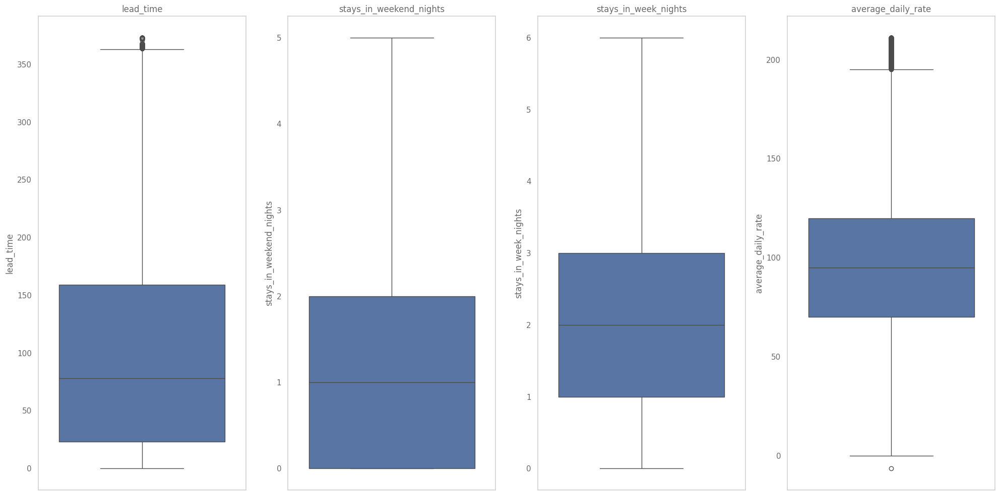

In [ ]:
# Plot box plots for numerical columns after impute outliers with the median
numerical_columns = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'average_daily_rate']
num_columns = len(numerical_columns)
nrows = 1
ncols = (num_columns // nrows) + (num_columns % nrows > 0)

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 10), sharey=False)
axes = axes.flatten()
# Iterate over each column and its corresponding subplot
for i, column in enumerate(numerical_columns):
    sns.boxplot(data=df_capped[column], ax=axes[i])
    axes[i].set_title(column)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
for i in numerical_columns:
  print(f"\033[1m{i} Statistics:\033[0m")
  print(boxplot_statistics(df_capped[i]))
  print()

lead_time Statistics:
{'median': 78.0, 'Q1': 23.0, 'Q3': 159.0, 'IQR': 136.0, 'lower_bound': -181.0, 'upper_bound': 363.0, 'min': 0.0, 'max': 373.0, 'outliers': 327, '% above upper bound': 0.37, '% below lower bound': 0.0}

stays_in_weekend_nights Statistics:
{'median': 1.0, 'Q1': 0.0, 'Q3': 2.0, 'IQR': 2.0, 'lower_bound': -3.0, 'upper_bound': 5.0, 'min': 0.0, 'max': 5.0, 'outliers': 0, '% above upper bound': 0.0, '% below lower bound': 0.0}

stays_in_week_nights Statistics:
{'median': 2.0, 'Q1': 1.0, 'Q3': 3.0, 'IQR': 2.0, 'lower_bound': -2.0, 'upper_bound': 6.0, 'min': 0.0, 'max': 6.0, 'outliers': 0, '% above upper bound': 0.0, '% below lower bound': 0.0}

average_daily_rate Statistics:
{'median': 95.0, 'Q1': 70.0, 'Q3': 120.0, 'IQR': 50.0, 'lower_bound': -5.0, 'upper_bound': 195.0, 'min': -6.38, 'max': 211.03, 'outliers': 1427, '% above upper bound': 1.61, '% below lower bound': 0.0}



The outliers for the variables **'lead_time', 'arrival_date_week_number', 'stays_in_weekend_nights', 'stays_in_week_nights', 'average_daily_rate'** were replaced with the median value. New columns were created **..._outlier_flag** that indicates if the value remains original (0) or if it was modified (1).

After doing that, we have still some outliers for **lead_time, stays_in_weekend_nights, and average_daily_rate**, since there are a small proportion, we decided to leave them as they are.

In [ ]:
#Delete the entries with adults=0
print((len(df_capped[df_capped['adults']==0])/len(df_capped))*100)
df_capped = df_capped[df_capped['adults']!=0]

0.31996201157742404


**0.31% of records contain zero in 'adults'**, since it represents a small proportion of the whole dataset, we will remove the rows rather than impute their values.

In [ ]:
df_capped.shape

(88165, 37)

# Skewness

In [ ]:
numerical_columns = ['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'average_daily_rate']
df_capped[numerical_columns].skew()

,0
lead_time,0.942211
stays_in_weekend_nights,0.725618
stays_in_week_nights,0.594480
average_daily_rate,0.413429


At first instance, I decided not to transform the data since is not highly skewed. However, I will check if with transformation the model will improve or not.

In [ ]:
df_capped.shape

(88165, 37)

# Data Preparation (Data Engineering, Feature Creation)

In [ ]:
df_prepared = df_capped.copy()

In [ ]:
#Create a new variable that represent the lenght of the stay
df_prepared['lenght_of_stay'] = df_prepared['stays_in_weekend_nights'] + df_prepared['stays_in_week_nights']

#Check how many records has zero for lenght_of_stay
len(df_prepared[df_prepared['lenght_of_stay']==0])

389

In [ ]:
#For the records where lenght_of_stay is zere were modified to 1.
df_prepared['lenght_of_stay'] = df_prepared['lenght_of_stay'].apply(lambda x: 1 if x == 0  else x)

#Check that there are any record with zero for lenght of the stay
len(df_prepared[df_prepared['lenght_of_stay']==0])

0

*   It was created a new column **lenght_of_stay** that represents the number of days of the stay. It was calculated summing up the number of nights in weekend and number of nights during the week.
*   There were 235 records where lenght of stay is zero, since the customer has to pay at least on night even though they leave the same day as their arrival, those records where change to 1 night.

In [ ]:
#Define the seasons
month_to_season = {
    'December':'Winter', 'January':'Winter', 'February':'Winter',
    'March':'Spring', 'April':'Spring', 'May':'Spring',
    'June':'Summer', 'July':'Summer', 'August':'Summer',
    'September':'Autumn', 'October':'Autumn', 'November':'Autumn',
}

#Create a new variable: Season
df_prepared['season'] = df_prepared['arrival_date_month'].map(month_to_season)

#Drop the columns that contains any date
df_prepared.drop(['arrival_date_year', 'arrival_date_month', 'arrival_date_day_of_month', 'arrival_date_week_number',
                  'reservation_status_date', 'arrival_date'], axis=1, inplace=True)

*   The column **season** was created and represents the season of the year of the booking.
*   The columns 'arrival_date_year', 'arrival_date_month', 'arrival_date_day_of_month', 'arrival_date_week_number', 'arrival_date' were dropped.
*   Given that is_canceled effectively captures whether a booking was completed or not, the **reservation_status** can be considered redundant and was dropped.



In [ ]:
#Change these integer variables for 0 and 1, where 1 aggregate (1,2,3,....)
df_prepared['weekend_nights'] = df_prepared['stays_in_weekend_nights'].apply(lambda x: 1 if x >= 1 else 0)
df_prepared['prior_cancellations'] = df_prepared['previous_cancellations'].apply(lambda x: 1 if x >= 1 else 0)
df_prepared['previous_sucessful_bookings'] = df_prepared['previous_bookings_not_canceled'].apply(lambda x: 1 if x >= 1 else 0)
df_prepared['booking_modifications'] = df_prepared['booking_changes'].apply(lambda x: 1 if x >= 1 else 0)
df_prepared['waiting_list'] = df_prepared['days_in_waiting_list'].apply(lambda x: 1 if x >= 1 else 0)
df_prepared['requires_parking'] = df_prepared['required_car_parking_spaces'].apply(lambda x: 1 if x >= 1 else 0)

#Drop the columns that were modified
df_prepared.drop(['stays_in_weekend_nights', 'previous_cancellations', 'previous_bookings_not_canceled',
                  'booking_changes', 'days_in_waiting_list', 'required_car_parking_spaces',
                  'stays_in_week_nights'], axis=1, inplace=True)

New variables were created indicating zero if the previous value was 0 and 1 if the previuos value was 1 or more, where:
*   **weekend_nights** The value is 1 if the booking includes one or more weekend nights, and 0 if the booking does not include any weekend nights.
*   **prior_cancellations** The value is 1 if the customer has had one or more previous bookings that were canceled, and 0 if the customer has had no previous cancellations.
*   **previous_sucessful_bookings** 1 if the customer had at least one successful (non-canceled) booking in the past, and 0 otherwise
*   **booking_modifications** The value is 1 if one or more changes were made to the booking, and 0 if no changes were made
*   **waiting_list** The value is 1 if the booking was on the waiting list for one or more days, and 0 if it was not on the waiting list at all
*   **requires_parking** The value is 1 if the customer requires one or more parking spaces, and 0 if no parking spaces are required.
*   The original columns were dropped.






In [ ]:
#Create column 'dependants' where children or babies are 1 or higher
df_prepared['dependants'] = ((df_prepared['children'] > 0) | (df_prepared['babies'] > 0)).astype(int)

#Drop columns 'children' and 'babies'
df_prepared.drop(['children', 'babies'], axis=1, inplace=True)



*   The column **dependants** was created and indicates if the booking has any children or babies.
*   The original columns **children** and **babies** were dropped.





In [ ]:
#Create a flag for more than 2 adults and a flag for more than 2 special requests
cols = ['adults', 'total_of_special_requests']

for column in cols:
  flag_column = f'{column}_flag'
  df_prepared[flag_column] = df_prepared[column].apply(lambda x: 1 if x > 2 else 0)

For the columns **adults** and **total_of_special_requests**, it was created a flag column for each of them where:
*   **adults_flag:** 1 indicates if the bookings has 2 or more adults, and 0 otherwise
*   **total_of_special_requests_flag** indicates with 1 if the bookings has 2 or more special requests, and 0 otherwise.

In [ ]:
#Create new columns that indicates if the booking was made through an agent or a company
df_prepared['booked_via_agent'] = df_prepared['agent'].apply(lambda x: 1 if x != 'NULL'  else 0)
df_prepared['booked_via_company'] = df_prepared['company'].apply(lambda x: 1 if x != 'NULL'  else 0)

#Drop columns 'agent' and 'company'
df_prepared.drop(['agent', 'company'], axis=1, inplace=True)

*   **booked_via_agent:** The value is 1 if the booking was made through an agent, and 0 if it was made directly by the customer
*   **booked_via_company:** The value is 1 if the booking was made through an company, and 0 if it was made directly by the customer



In [ ]:
#Create a new column where 0-indicates that reserved and assigned room type are the same, and 1-there's a difference between both
df_prepared['room_type_modified'] = (df_prepared['reserved_room_type'] != df_prepared['assigned_room_type']).astype(int)

#Drop columns
df_prepared.drop(['reserved_room_type', 'assigned_room_type'], axis=1, inplace=True)

*   The new column **room_type_modified** The value is 1 if there was a discrepancy between the reserved and assigned rooms, and 0 if the reserved room and the assigned room were the same.



In [ ]:
#Define function that converts the code country to name country (i.e., 'PRT' to 'Portugal')
def get_country_name(country_code):
    if len(country_code) == 2:
        try:
          country = pycountry.countries.get(alpha_3=country_code)
          if country:
            return country.name
          else:
            return None
        except LookupError:
          return None
    elif len(country_code) == 3:
        try:
          country = pycountry.countries.get(alpha_3=country_code)
          if country:
            return country.name
          else:
            return None
        except AttributeError:
            return None
    else:
        return None

#Create new column 'country_name'
df_prepared['country_name'] = df_prepared['country'].apply(get_country_name)

In [ ]:
#Define the region mapping
regions = {
      'Northern Europe': ['United Kingdom', 'Ireland', 'Sweden', 'Norway', 'Denmark', 'Finland', 'Estonia', 'Lithuania', 'Latvia', 'Iceland', 'Jersey', 'Guernsey', 'Faroe Islands', 'Isle of Man'],
      'South Europe': ['Portugal', 'Spain', 'Italy', 'Greece', 'Croatia', 'Serbia', 'Slovenia', 'Gibraltar', 'Albania', 'Malta', 'Andorra', 'Bosnia and Herzegovina', 'North Macedonia', 'Montenegro'],
      'Eastern Europe': ['Poland', 'Russian Federation', 'Romania', 'Hungary', 'Ukraine', 'Bulgaria', 'Slovakia', 'Belarus'],
      'Western Europe': ['France', 'Germany', 'Belgium', 'Netherlands', 'Switzerland', 'Austria', 'Luxembourg', 'Monaco', 'Liechtenstein']
      }

region_mapping = {country: region for region, countries in regions.items() for country in countries}

#Function to classify countries into regions
def classify_region(country_name):
  return region_mapping.get(country_name, 'Other Region')

#Create new column 'Region'
df_prepared['region'] = df_prepared['country_name'].apply(classify_region)

#Drop columns 'country' and 'country_name'
df_prepared.drop(['country', 'country_name'], axis=1, inplace=True)

*   The new column **region** indicates which region the booking was made: Northern Europe, South Europe, Eastern Europe, or Western Europe. The column **country** was dropped.



In [ ]:
#Change 'Undefined' category for 'SC' for the variable 'meal'
df_prepared['meal'] = df_prepared['meal'].replace('Undefined', 'SC')

*  For the column **meal**, the category Undefined was changed to SC (Sell Catering) indicating the booking didn't reserve any meal.



In [ ]:
df_prepared.info()

<class 'pandas.core.frame.DataFrame'>
Index: 88165 entries, 0 to 88447
Data columns (total 32 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   is_canceled                           88165 non-null  category
 1   lead_time                             88165 non-null  float64 
 2   adults                                88165 non-null  int64   
 3   meal                                  88165 non-null  object  
 4   market_segment                        88165 non-null  object  
 5   distribution_channel                  88165 non-null  object  
 6   is_repeated_guest                     88165 non-null  category
 7   deposit_type                          88165 non-null  object  
 8   customer_type                         88165 non-null  object  
 9   average_daily_rate                    88165 non-null  float64 
 10  total_of_special_requests             88165 non-null  int64   
 11  reserva

In [ ]:
#Convert all the necessary variables to category
categorical_columns = ['meal', 'market_segment', 'distribution_channel', 'deposit_type', 'customer_type', 'reservation_status',
                       'lead_time_outlier_flag', 'average_daily_rate_outlier_flag', 'season', 'weekend_nights',
                       'prior_cancellations', 'previous_sucessful_bookings', 'booking_modifications',
                       'waiting_list', 'requires_parking', 'dependants', 'adults_flag',
                       'total_of_special_requests_flag', 'booked_via_agent', 'booked_via_company', 'room_type_modified', 'region']

for column in categorical_columns:
  df_prepared[column] = df_prepared[column].astype('category')

#Convert float variables into int
numerical_columns = ['lead_time', 'average_daily_rate', 'adults', 'total_of_special_requests', 'lenght_of_stay']

for column in numerical_columns:
  df_prepared[column] = df_prepared[column].astype(int)

#check datatypes
df_prepared.info()

<class 'pandas.core.frame.DataFrame'>
Index: 88165 entries, 0 to 88447
Data columns (total 32 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   is_canceled                           88165 non-null  category
 1   lead_time                             88165 non-null  int64   
 2   adults                                88165 non-null  int64   
 3   meal                                  88165 non-null  category
 4   market_segment                        88165 non-null  category
 5   distribution_channel                  88165 non-null  category
 6   is_repeated_guest                     88165 non-null  category
 7   deposit_type                          88165 non-null  category
 8   customer_type                         88165 non-null  category
 9   average_daily_rate                    88165 non-null  int64   
 10  total_of_special_requests             88165 non-null  int64   
 11  reserva

In [ ]:
df_prepared.shape

(88165, 32)

# Partition

In [ ]:
#Remove column 'reservation_status'
df_dummies = df_prepared.copy()
df_dummies.drop(['reservation_status'], axis=1, inplace=True)

In [ ]:
#Remaining variables that have different categories
categorical_columns = ['meal', 'market_segment', 'distribution_channel', 'deposit_type', 'customer_type','region', 'season']

#Create dummies for those varibles
df_dummies = pd.get_dummies(df_dummies, columns=categorical_columns, drop_first=True)
df_dummies = df_dummies.astype(int)

In [ ]:
df_dummies.shape

(88165, 51)

In [ ]:
#Split the dataset into 60% training and 40% validation
outcome = 'is_canceled'
predictors = [c for c in df_dummies.columns if c != outcome]

X = df_dummies[predictors]
y = df_dummies[outcome]

X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.4, random_state=1)

*   The variable that will be predicted is **is_canceled**.
*   The dataset was split into 60% training and 40% validation.





In [ ]:
df_capped.describe()

,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,...,days_in_waiting_list,average_daily_rate,required_car_parking_spaces,total_of_special_requests,reservation_status_date,arrival_date,lead_time_outlier_flag,average_daily_rate_outlier_flag,stays_in_weekend_nights_outlier_flag,stays_in_week_nights_outlier_flag
count,88165.000000,88165.000000,88165.000000,88165.000000,88165.000000,88165.000000,88165.000000,88165.000000,88165.000000,88165.000000,...,88165.000000,88165.000000,88165.000000,88165.000000,88165,88165,88165.000000,88165.000000,88165.000000,88165.000000
mean,101.733522,2016.157387,27.210741,15.768015,0.912426,2.307843,1.871241,0.100947,0.007373,0.111427,...,2.575455,97.742129,0.049850,0.523938,2016-07-19 02:03:52.173765376,2016-08-29 08:46:37.518289920,0.029241,0.032008,0.002405,0.027709
min,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,-6.380000,0.000000,0.000000,2014-10-17 00:00:00,2015-07-01 00:00:00,0.000000,0.000000,0.000000,0.000000
25%,23.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,...,0.000000,70.000000,0.000000,0.000000,2016-01-19 00:00:00,2016-03-16 00:00:00,0.000000,0.000000,0.000000,0.000000
50%,78.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,...,0.000000,95.000000,0.000000,0.000000,2016-07-25 00:00:00,2016-09-08 00:00:00,0.000000,0.000000,0.000000,0.000000
75%,159.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,...,0.000000,120.000000,0.000000,1.000000,2017-01-29 00:00:00,2017-03-22 00:00:00,0.000000,0.000000,0.000000,0.000000
max,373.000000,2017.000000,53.000000,31.000000,5.000000,6.000000,55.000000,10.000000,9.000000,26.000000,...,391.000000,211.030000,8.000000,5.000000,2017-09-14 00:00:00,2017-08-31 00:00:00,1.000000,1.000000,1.000000,1.000000
std,93.553308,0.708982,13.490940,8.778301,0.947614,1.385284,0.593378,0.392837,0.091443,0.963711,...,18.382196,39.405993,0.220226,0.774658,NaN,NaN,0.168481,0.176023,0.048978,0.164140


In [ ]:
df_capped.describe(include = ['object', 'category'])

,is_canceled,arrival_date_month,meal,country,market_segment,distribution_channel,is_repeated_guest,reserved_room_type,assigned_room_type,deposit_type,agent,company,customer_type,reservation_status,hotel_type
count,88165,88165,88165,88165,88165,88165,88165,88165,88165,88165,88165,88165,88165,88165,88165
unique,2,12,5,163,8,5,2,9,11,3,308,299,4,3,2
top,1,August,BB,PRT,Online TA,TA/TO,0,A,A,No Deposit,9,NULL,Transient,Check-Out,0
freq,44115,10304,68241,40101,41666,73954,85791,64352,57073,73510,24093,83686,67533,44050,60002


# Baseline

In [ ]:
from sklearn.dummy import DummyClassifier
dummy = DummyClassifier(strategy="most_frequent")
dummy.fit(X_train, y_train)
print(f'Baseline Training Score: {dummy.score(X_train, y_train)}')
print(f'Baseline Validation Score: {dummy.score(X_valid, y_valid)}')

Baseline Training Score: 0.5003119151590767
Baseline Validation Score: 0.49861055974593094


# Decision Tree

## *Full Tree*

In [ ]:
#Full Classification Tree
fullClassTree = DecisionTreeClassifier (random_state=1)
fullClassTree.fit(X_train, y_train)

#Predict on the valid set
y_pred = fullClassTree.predict(X_valid)
y_pred_proba = fullClassTree.predict_proba(X_valid)

#Calculate the accuracy and ROC AUC
accuracy_train = accuracy_score(y_train, fullClassTree.predict(X_train))
accuracy_valid = accuracy_score(y_valid, y_pred)
roc_auc = roc_auc_score(y_valid, y_pred_proba[:, 1])

#Print the results
print(f'Training Accuracy: {accuracy_train:.4f}')
print(f'Validation Accuracy: {accuracy_valid:.4f}')
print(f'ROC AUC: {roc_auc:.4f}')

Training Accuracy: 0.9952
Validation Accuracy: 0.8203
ROC AUC: 0.8226


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.113203 to fit


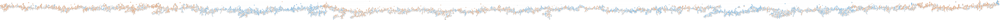

In [ ]:
#Plot Classification Tree
plotDecisionTree(fullClassTree, feature_names=X_train.columns, class_names=fullClassTree.classes_)

In [ ]:
classificationSummary(y_valid, fullClassTree.predict(X_valid))

Confusion Matrix (Accuracy 0.8203)

       Prediction
Actual     0     1
     0 14333  3251
     1  3086 14596


**Interpretation:** The model achieved a good accuracy on the validation set of 82.03%, reflecting its performance on unseen data and suggesting good generalization to new instances. The ROC AUC score was 0.8226 indicating that the model has a string ability to discriminate between classes

## *Cross Validation*

In [ ]:
param_grid = {'max_depth': [5, 10, 15, 20, 25],
              'min_samples_split': [0.07, 0.05, 0.01, 0.005, 0.0025, 0.002, 0.001],
              'min_impurity_decrease': [0.0002, 0.00015, 0.00010, 0.00008, 0.00005]}

In [ ]:
gridsearch = GridSearchCV(DecisionTreeClassifier(random_state=301314502), param_grid, cv = 5, n_jobs=-1)
gridsearch.fit(X_train, y_train)

#Predict on the valid set
y_pred = gridsearch.predict(X_valid)
y_pred_proba = gridsearch.predict_proba(X_valid)

#Calculate the accuracy and ROC AUC
accuracy_train = accuracy_score(y_train, gridsearch.predict(X_train))
accuracy_valid = accuracy_score(y_valid, y_pred)
roc_auc = roc_auc_score(y_valid, y_pred_proba[:, 1])

#Print the results
print(f'Training Accuracy: {accuracy_train:.4f}')
print(f'Validation Accuracy: {accuracy_valid:.4f}')
print(f'ROC AUC: {roc_auc:.4f}')

Training Accuracy: 0.8613
Validation Accuracy: 0.8320
ROC AUC: 0.9189


In [ ]:
gridsearch.best_params_

{'max_depth': 25, 'min_impurity_decrease': 5e-05, 'min_samples_split': 0.001}

In [ ]:
gridClassTree = gridsearch.best_estimator_

In [ ]:
plotDecisionTree(gridClassTree, feature_names=X_train.columns, class_names=gridClassTree.classes_)

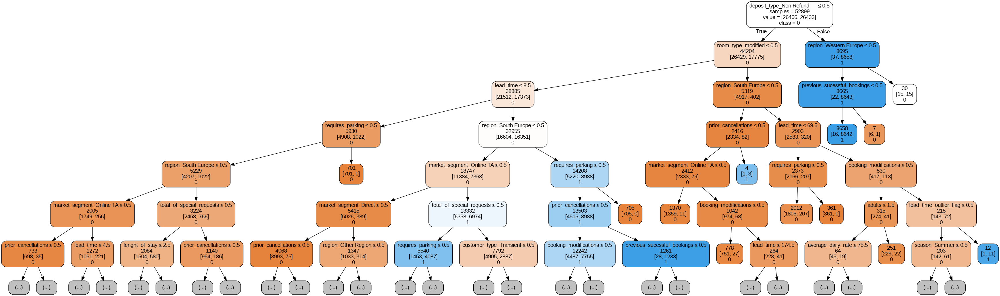

In [ ]:
plotDecisionTree(gridClassTree, feature_names=X_train.columns, class_names=gridClassTree.classes_, max_depth=6)

In [ ]:
classificationSummary(y_valid, gridsearch.predict(X_valid))

Confusion Matrix (Accuracy 0.8320)

       Prediction
Actual     0     1
     0 14768  2816
     1  3107 14575


In [ ]:
#Calculate feature importance

for i, column in enumerate(X_train.columns):
  #print(f'{column}: {gridClassTree.feature_importances_[i]}')
  fi = pd.DataFrame({'feature': X_train.columns, 'importance': gridClassTree.feature_importances_})

fi.sort_values('importance', ascending = False).head(10)

,feature,importance
38,deposit_type_Non Refund,0.321856
32,market_segment_Online TA,0.108444
0,lead_time,0.107653
22,room_type_modified,0.081042
4,total_of_special_requests,0.076787
45,region_South Europe,0.061287
16,requires_parking,0.054352
3,average_daily_rate,0.039319
12,prior_cancellations,0.024646
41,customer_type_Transient,0.018857


In [ ]:
result = pd.DataFrame({'actual': y_valid,
                             'p_0': [p[0] for p in y_pred_proba],
                             'p_1': [p[1] for p in y_pred_proba],
                             'predicted': y_pred})

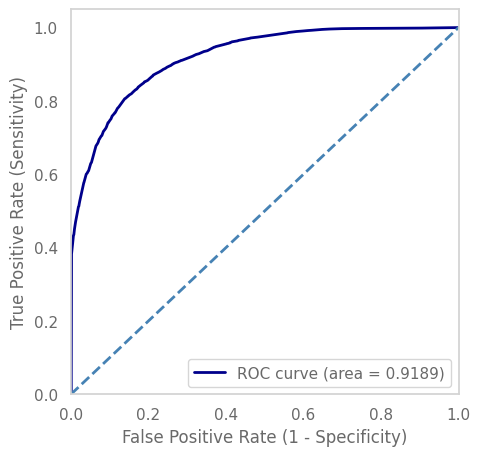

In [ ]:
fpr, tpr, _ = roc_curve(result['actual'], result['p_1'])
roc_auc = auc(fpr, tpr)
plt.figure(figsize=[5, 5])
plt.plot(fpr, tpr, color='darkblue',
 lw=2, label='ROC curve (area = %0.4f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='steelblue', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.legend(loc="lower right")

In [ ]:
#Understanding the characteristics of bookings with a non-refundable deposit
df_prepared.groupby(df_prepared['deposit_type']).describe(include='all')

<ipython-input-137-0e9ecae223f5>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_prepared.groupby(df_prepared['deposit_type']).describe(include='all')


is_canceled                                                \
                      count unique  top     freq mean std min 25% 50% 75%   
deposit_type                                                                
No Deposit          73510.0    2.0  0.0  43925.0  NaN NaN NaN NaN NaN NaN   
Non Refund          14550.0    2.0  1.0  14494.0  NaN NaN NaN NaN NaN NaN   
Refundable            105.0    2.0  0.0     69.0  NaN NaN NaN NaN NaN NaN   

                 ... region                                                   \
                 ... unique              top   freq mean  std  min  25%  50%   
deposit_type     ...                                                           
No Deposit       ...      5     South Europe  34750  NaN  NaN  NaN  NaN  NaN   
Non Refund       ...      5     South Europe  14310  NaN  NaN  NaN  NaN  NaN   
Refundable       ...      5  Northern Europe     47  NaN  NaN  NaN  NaN  NaN   

                           
                 75%  max  
deposit_type               
No Deposit       NaN  NaN  
Non Refund       NaN  NaN  
Refundable       NaN  NaN  

[3 rows x 341 columns]

**Interpretation:** The tree using hyperparameters had an accuracy of 83.20%. The variable more important seems to be **Non_Refundable_Deposit**, where customers who pay a non-refundable deposit have a much higher percentage of canceled reservations.
*   The primary factor that influences cancellation rates is bookings with non-refundable deposits showing a strong split in cancellation behavior. Surprisingly, non-refundable bookings have a higher chance of cancellation (99.6%)
*   The data suggests that when customers receive the exact room they reserved, they are more likely to cancel. Exact room assignments experience a significantly higher cancellation rate, 44.6% (17,373 records out of 38,885), compared to those with different room assignments, 7.55% (402 out of 5,319 records).
*   The data suggests that longer lead times present a higher cancellation rate on bookings. In this particular node, bookings with lead times less than 8.5 days have a likelihood of cancellation of 17.23% compared to those with greater than 8.5 days with a 49.61% chance of cancellation.





# Random Forest

In [ ]:
RandomForest =  RandomForestClassifier(random_state=1, n_estimators=500)
RandomForest.fit(X_train, y_train)

#Predict on the valid set
y_pred = RandomForest.predict(X_valid)
y_pred_proba = RandomForest.predict_proba(X_valid)

#Calculate the accuracy and ROC AUC
accuracy_train = accuracy_score(y_train, RandomForest.predict(X_train))
accuracy_valid = accuracy_score(y_valid, y_pred)
roc_auc = roc_auc_score(y_valid, y_pred_proba[:, 1])

#Print the results
print(f'Training Accuracy: {accuracy_train:.4f}')
print(f'Validation Accuracy: {accuracy_valid:.4f}')
print(f'ROC AUC: {roc_auc:.4f}')

Training Accuracy: 0.9952
Validation Accuracy: 0.8558
ROC AUC: 0.9389


In [ ]:
classificationSummary(y_valid, RandomForest.predict(X_valid))

Confusion Matrix (Accuracy 0.8558)

       Prediction
Actual     0     1
     0 15111  2473
     1  2612 15070


In [ ]:
importances = RandomForest.feature_importances_
std = np.std([tree.feature_importances_ for tree in RandomForest.estimators_], axis=0)

df_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
df_importances.sort_values('importance', ascending = False)

,feature,importance,std
0,lead_time,0.191787,0.022487
3,average_daily_rate,0.125617,0.006101
38,deposit_type_Non Refund,0.091402,0.064869
4,total_of_special_requests,0.061693,0.017178
10,lenght_of_stay,0.058443,0.004741
45,region_South Europe,0.052689,0.028859
22,room_type_modified,0.043749,0.017686
16,requires_parking,0.030907,0.009140
32,market_segment_Online TA,0.027894,0.016989
12,prior_cancellations,0.025411,0.014781


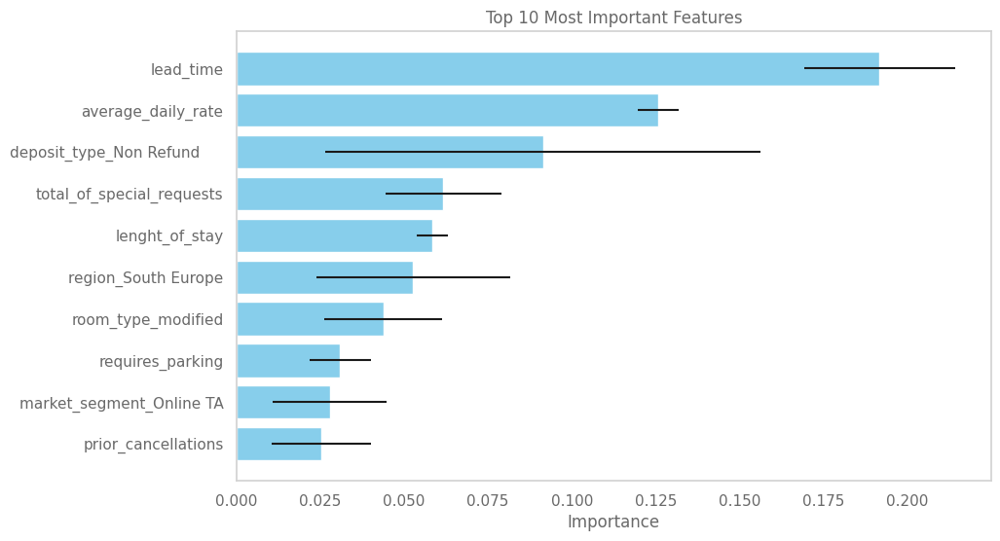

In [ ]:
#Create a bar chart just with the 10 most important variables
top_10_importances = df_importances.sort_values('importance', ascending=False).head(10)

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.barh(top_10_importances['feature'], top_10_importances['importance'], xerr=top_10_importances['std'], color='skyblue')
plt.xlabel('Importance')
plt.title('Top 10 Most Important Features')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.show()

**Interpretation:** the Random Forest model achieved an accuracy of 85.58% on the validation set, indicating a strong performance in classifying bookings accurately. The model achieved a ROC AUC score of 0.9389 demonstrating excellent discriminative ability, effectively distinguishing between bookings that will be canceled and those that will not.
*   The feature importance reveals that lead_time and average_daily_price are the most influential features in predicting bookings cancellations, followed by deposit_type_Non Refund and total_of_special_requests.



# Standardization

In [ ]:
scale = StandardScaler()
X_train_scale = scale.fit_transform(X_train)
X_valid_scale = scale.transform(X_valid)
X_train_scale = pd.DataFrame(X_train_scale, columns=X_train.columns)
X_valid_scale = pd.DataFrame(X_valid_scale, columns=X_valid.columns)

# Logistic Regression

## *Full Regression*

In [ ]:
logit_reg = LogisticRegression(solver = 'liblinear', C=1e42, random_state=301314502)
logit_reg.fit(X_train_scale, y_train)

#Predict on the valid set
y_pred = logit_reg.predict(X_valid_scale)
y_pred_proba = logit_reg.predict_proba(X_valid_scale)

#Calculate the accuracy and ROC AUC
accuracy_train = accuracy_score(y_train, logit_reg.predict(X_train_scale))
accuracy_valid = accuracy_score(y_valid, y_pred)
roc_auc = roc_auc_score(y_valid, y_pred_proba[:, 1])

#Print the results
print(f'Training Accuracy: {accuracy_train:.4f}')
print(f'Validation Accuracy: {accuracy_valid:.4f}')
print(f'ROC AUC: {roc_auc:.4f}')

Training Accuracy: 0.8051
Validation Accuracy: 0.7989
ROC AUC: 0.8919


In [ ]:
classificationSummary(y_valid, logit_reg.predict(X_valid_scale))

Confusion Matrix (Accuracy 0.7989)

       Prediction
Actual     0     1
     0 14456  3128
     1  3965 13717


In [ ]:
logit_reg.coef_
pd.DataFrame({'coef':logit_reg.coef_[0], 'odds':np.e**logit_reg.coef_[0]},index=X.columns).sort_values(by = 'odds', ascending = False).head(10)

,coef,odds
deposit_type_Non Refund,1.729239,5.636364
prior_cancellations,1.021151,2.776388
region_South Europe,0.617020,1.853397
lead_time,0.554866,1.741707
customer_type_Transient,0.447682,1.564681
market_segment_Online TA,0.381181,1.464012
average_daily_rate,0.257049,1.293109
customer_type_Transient-Party,0.183098,1.200932
lead_time_outlier_flag,0.179367,1.196460
lenght_of_stay,0.152470,1.164708


In [ ]:
log_reg_prob = logit_reg.predict_proba(X_valid_scale)
log_reg_pred = logit_reg.predict(X_valid_scale)

In [ ]:
log_result = pd.DataFrame({'actual': y_valid,
                             'p_0': [p[0] for p in log_reg_prob],
                             'p_1': [p[1] for p in log_reg_prob],
                             'predicted': log_reg_pred})
log_result.head(10)

,actual,p_0,p_1,predicted
39204,0,0.524838,0.475162,0
86482,0,0.580916,0.419084,0
17907,1,0.149894,0.850106,1
71441,1,0.620517,0.379483,0
23122,1,0.320745,0.679255,1
56926,0,0.429717,0.570283,1
67184,0,0.424792,0.575208,1
24317,1,0.237515,0.762485,1
72437,1,0.293606,0.706394,1
77126,1,0.003195,0.996805,1


<Axes: xlabel='# records', ylabel='# cumulative gains'>

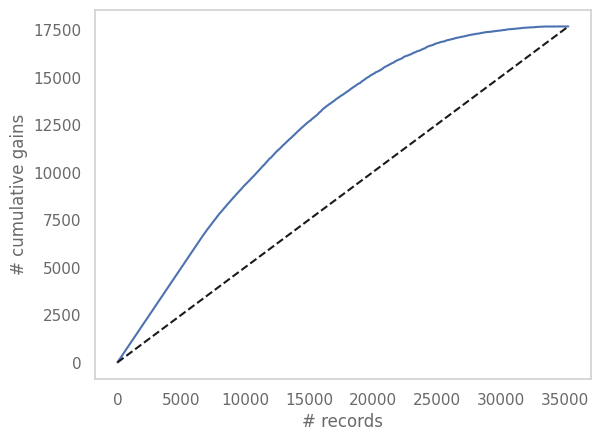

In [ ]:
log_result = log_result.sort_values(by = 'p_1', ascending = False)
gainsChart(log_result.actual)

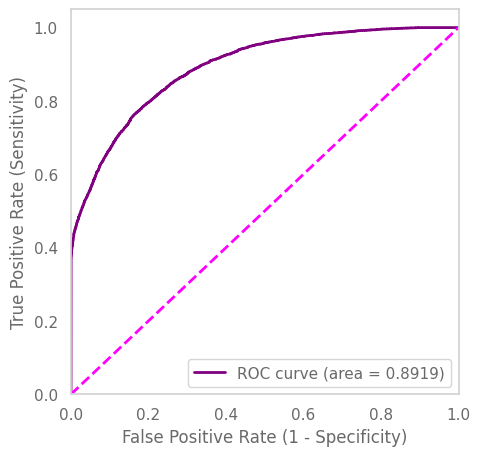

In [ ]:
fpr, tpr, _ = roc_curve(log_result['actual'], log_result['p_1'])
roc_auc = auc(fpr, tpr)
plt.figure(figsize=[5, 5])
plt.plot(fpr, tpr, color='purple',
 lw=2, label='ROC curve (area = %0.4f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='magenta', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.legend(loc="lower right")

**Interpretation:**
*   The model achieved an accuracy of 79.89% on the validation set, demonstrating its effectiveness in correctly classifying bookings.
*   The ROC AUC score of 0.8919 indicates that the model has strong discriminatory power distinguishing between cancellations and non-cancellations.

